# <center>PRÁCTICA 1: APRENDIZAJE NO SUPERVISADO (DengAI)<center>

**Nombre y apellidos:** Jonnathan Campoberde

**Usuario VIU:** jcampoberdea

---
# Resumen
---

La fiebre del dengue es una enfermedad transmitida por mosquitos que ocurre en las partes tropicales y subtropicales del mundo. En casos leves, los síntomas son similares a los de la gripe: fiebre, erupción cutánea y dolor muscular y articular. En casos graves, la fiebre del dengue puede causar hemorragias graves, presión arterial baja e incluso la muerte. Debido a que es transmitida por mosquitos, la dinámica de transmisión del dengue está relacionada con variables climáticas como la temperatura y la precipitación.

El análisis del dataset DengAI usando métodos de aprendizaje no supervisado incluyó la conversión de temperaturas de grados Kelvin a Celsius para facilitar la interpretación de los resultados. En el preprocesamiento, se eliminaron los outliers en lugar de imputarlos, ya que se consideró que esto evitaría sobreajustes y era adecuado dada la pequeña cantidad de registros atípicos.

Dado que el dataset tenía muchas características, se realizó una selección y normalización de variables para asegurar que los datos estuvieran en una escala común. Posteriormente, se probaron diferentes algoritmos de clustering: Aglomerativo, K-means, Gaussian Mixture Model, OPTICS y Jerárquico. La reducción de dimensionalidad con T-SNE mostró que el algoritmo Aglomerativo fue el más efectivo, con una clara separación de los clusters.

Los resultados revelaron tres grupos bien diferenciados. En el Cluster 0, predomina San Juan, con temperaturas moderadas y un rango de NDVI más alto. En el Cluster 1, Iquitos muestra temperaturas ligeramente más altas y un NDVI bajo. Finalmente, en el Cluster 2, también Iquitos, las temperaturas son más frescas y el NDVI sigue siendo bajo.

---
# Inicialización
---

In [7]:
# Imports generales
# Se importan las librerias necesarias y configuraciones globales para el desarrollo de la actividad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import zscore
from sklearn.preprocessing import LabelEncoder, RobustScaler
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.manifold import TSNE
from sklearn import cluster
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture
import missingno as msno
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.manifold import TSNE
from sklearn import cluster
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture
import itertools
from sklearn.cluster import OPTICS
from sklearn.preprocessing import RobustScaler
import io
from google.colab import files

seed = 42
pd.set_option('display.max_columns', None)



In [8]:
def upload_files (index_fields=None):
  uploaded = files.upload()
  for fn in uploaded.keys():
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=fn, length=len(uploaded[fn])))
    df = pd.read_csv(io.StringIO(uploaded[fn].decode('utf-8')), index_col = index_fields)
    return df

In [9]:
dengue_df = upload_files()#dataset de dengue_features_train.csv
dengue_df.head(5)

Saving dengue_features_train.csv to dengue_features_train (1).csv
User uploaded file "dengue_features_train (1).csv" with length 288596 bytes


,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


---
# Exploración
---

## Recopilación de Datos
Los datos a ser usados a lo largo del analisis fueron proporcionados por driven data, los cuales contienen multiples caracteristicas de la ciudad, datos meteorologicos relacionadas a la problematica de los mosquitos del dengue, los mismos que se pueden encontrar en la siguiente enlace https://erdem.pl/2020/07/deng-ai-how-to-approach-data-science-competitions-eda

### Descripción de los datos

| Columna                           | Descripción                                                        |
|-----------------------------------|--------------------------------------------------------------------|
| city                              | Abreviaturas de ciudades: sj para San Juan e iq para Iquitos       |
| week_start_date                   | Fecha dada en formato yyyy-mm-dd                                   |
| station_max_temp_c                | Temperatura máxima                                                 |
| station_min_temp_c                | Temperatura mínima                                                 |
| station_avg_temp_c                | Temperatura promedio                                               |
| station_precip_mm                 | Precipitación total                                                |
| station_diur_temp_rng_c           | Rango de temperatura diurna                                        |
| precipitation_amt_mm              | Precipitación total                                                |
| reanalysis_sat_precip_amt_mm      | Precipitación total                                                |
| reanalysis_dew_point_temp_k       | Temperatura media del punto de rocío                               |
| reanalysis_air_temp_k             | Temperatura media del aire                                         |
| reanalysis_relative_humidity_percent | Humedad relativa media                                             |
| reanalysis_specific_humidity_g_per_kg | Humedad específica media                                           |
| reanalysis_precip_amt_kg_per_m2   | Precipitación total                                                |
| reanalysis_max_air_temp_k         | Temperatura máxima del aire                                        |
| reanalysis_min_air_temp_k         | Temperatura mínima del aire                                        |
| reanalysis_avg_temp_k             | Temperatura promedio del aire                                      |
| reanalysis_tdtr_k                 | Rango de temperatura diurna                                        |
| ndvi_se                           | Píxel al sureste del centroide de la ciudad                        |
| ndvi_sw                           | Píxel al suroeste del centroide de la ciudad                       |
| ndvi_ne                           | Píxel al noreste del centroide de la ciudad                        |
| ndvi_nw                           | Píxel al noroeste del centroide de la ciudad                       |


In [10]:
# Verificar si los índices son únicos
print("Verificar si los índices son únicos: ",dengue_df.index.is_unique)
# Verificar si las columnas son únicas
print("Verificar si las columnas son únicas:",dengue_df.columns.is_unique)

Verificar si los índices son únicos:  True
Verificar si las columnas son únicas: True


In [11]:
registros, columnas = (dengue_df.shape)
print("El dataset contiene {registros} registros y {columnas} columnas.".format(registros=registros,columnas=columnas))

El dataset contiene 1456 registros y 24 columnas.


In [12]:
#Se imprime todas las columnas del dataset
print('Las columnas del dataset: {columnas}'.format(columnas=','.join(dengue_df.columns.to_list())))

Las columnas del dataset: city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm


### Descripción de manera general de los tipos de variable para las columnas del dataframe

In [13]:
dengue_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 24 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1456 non-null   object 
 1   year                                   1456 non-null   int64  
 2   weekofyear                             1456 non-null   int64  
 3   week_start_date                        1456 non-null   object 
 4   ndvi_ne                                1262 non-null   float64
 5   ndvi_nw                                1404 non-null   float64
 6   ndvi_se                                1434 non-null   float64
 7   ndvi_sw                                1434 non-null   float64
 8   precipitation_amt_mm                   1443 non-null   float64
 9   reanalysis_air_temp_k                  1446 non-null   float64
 10  reanalysis_avg_temp_k                  1446 non-null   float64
 11  rean

In [14]:
#Se muestra la cantidad de registros por columa que tienen valores nulos
pd.DataFrame(dengue_df.isna().sum()).T.style.background_gradient()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,0,0,0,0,194,52,22,22,13,10,10,10,10,10,10,10,13,10,10,43,43,20,14,22


Se observa que el dataset tiene registros nulos en diversas columnas que se debe de analizar en las etapas posteriores

### Verificar la cantidad de registros duplicados

In [15]:
dengue_duplicated = dengue_df[dengue_df.duplicated()]
dengue_duplicated

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm


No existen registros con datos duplicados que deban ser eliminados del dataframe

### Descripción de los datos de manera general usando medidas estadisticas
Se muestra los datos como si fueran un mapa da calor para poder identificar de mejor manera los datos extremos para una variable

In [16]:
dengue_df.describe(percentiles=[.25, .50, .75, 1]).T.style.background_gradient()

,count,mean,std,min,25%,50%,75%,100%,max
year,1456.000000,2001.031593,5.408314,1990.000000,1997.000000,2002.000000,2005.000000,2010.000000,2010.000000
weekofyear,1456.000000,26.503434,15.019437,1.000000,13.750000,26.500000,39.250000,53.000000,53.000000
ndvi_ne,1262.000000,0.142294,0.140531,-0.406250,0.044950,0.128817,0.248483,0.508357,0.508357
ndvi_nw,1404.000000,0.130553,0.119999,-0.456100,0.049217,0.121429,0.216600,0.454429,0.454429
ndvi_se,1434.000000,0.203783,0.073860,-0.015533,0.155087,0.196050,0.248846,0.538314,0.538314
ndvi_sw,1434.000000,0.202305,0.083903,-0.063457,0.144209,0.189450,0.246982,0.546017,0.546017
precipitation_amt_mm,1443.000000,45.760388,43.715537,0.000000,9.800000,38.340000,70.235000,390.600000,390.600000
reanalysis_air_temp_k,1446.000000,298.701852,1.362420,294.635714,297.658929,298.646429,299.833571,302.200000,302.200000
reanalysis_avg_temp_k,1446.000000,299.225578,1.261715,294.892857,298.257143,299.289286,300.207143,302.928571,302.928571
reanalysis_dew_point_temp_k,1446.000000,295.246356,1.527810,289.642857,294.118929,295.640714,296.460000,298.450000,298.450000


### Eliminar y crear columnas en el dataframe sin procesar
Se elimina algunas las columnas del dataframe al considerar que no aportan información relevante en el modelo

+ Se crea la columna `month` al considerar que el mes es información importante pues el dengue es una enfermedad cuyo brote está relacionado con factores climáticos, como la precipitación, las temperaturas altas y la humedad relativa, que favorecen la proliferación de los mosquitos vectores que comunmente aumenta en ciertas epocas del año. **

+ Se elimina la columna `week_start_date` al considerar que no aportan información relevante en el modelo pues se ha obtenido el mes y la semana donde se recopilo los datos. **

In [17]:
if ("week_start_date" in dengue_df.columns):
    dengue_df['week_start_date'] = pd.to_datetime(dengue_df['week_start_date'])
    dengue_df['month'] = dengue_df['week_start_date'].dt.month
    dengue_df.drop("week_start_date", axis = 1, inplace = True)

#### Códificación de variables categoricas
En este caso la variable categorica city se codifica a una variable numerica antes de aplicar algoritmos debido a que facilita el analisis de los datos al ser numericos

In [18]:
#Se codifica los datos de las varaible de la ciuddad para poder aplicar la imputación MICE
le = LabelEncoder()
df_imputar = dengue_df.copy()
df_imputar['city'] = le.fit_transform(df_imputar['city'])
# Ver las clases mapeadas por LabelEncoder
print('Las clases fueron mapeadas en este orden: ',le.classes_)
df_imputar

Las clases fueron mapeadas en este orden:  ['iq' 'sj']


,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
0,1,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,1,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,1,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,5
3,1,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,5
4,1,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,0,2010,21,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,296.825714,309.7,294.5,45.00,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0,5
1452,0,2010,22,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,296.452857,308.5,291.9,207.10,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6,6
1453,0,2010,23,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,295.501429,305.5,292.4,50.60,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4,6
1454,0,2010,24,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,297.521429,295.324286,306.1,291.9,62.33,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0,6


### Eliminar los datos duplicados del dataframe
En este caso el dataframe no contiene datos duplicados por lo que no es necesario realizar este paso en nuestro dataframe


#### Analisis de los datos que tienen valores nulos
En el analisis anterior se verifico que el campo `ndvi_ne` es el que más tiene datos faltantes y al tener 257 datos de un total de 1456 lo cual es una cantidad considerable por lo que se va a completar estos valores usando la interpolación basándose en los valores adyacentes.

#### Visualización de Patrones de Nulos

<Axes: >

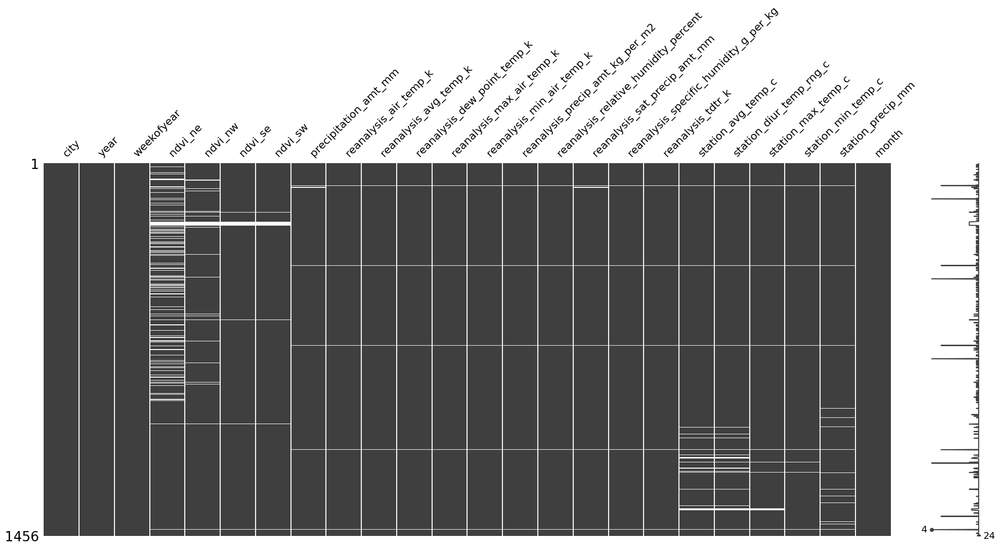

In [19]:
# Visualizar los valores nulos
msno.matrix(df_imputar)

#### Imputar los valores nulos en el dataframe
Se divide los datos por las ciudades para aprovechar los datos historicos por ciudad con el objetivo de tener los datos a imputar con mejor calidad, adicional a ello se usa `Multiple Imputation by Chained Equations (MICE)` es un método estadístico de imputación múltiple que permite llenar valores faltantes en un conjunto de datos de manera iterativa y utilizando modelos específicos para cada variable incompleta.

In [20]:
dengue_df_sj = df_imputar[df_imputar['city']==1]
# imputador iterativo (MICE)
mice_imputer = IterativeImputer(random_state=seed)
# aplicar el imputador al DataFrame
dengue_df_sj_imputed = pd.DataFrame(mice_imputer.fit_transform(dengue_df_sj), columns=dengue_df_sj.columns)
dengue_df_sj_imputed.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
0,1.0,1990.0,18.0,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4.0
1,1.0,1990.0,19.0,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5.0
2,1.0,1990.0,20.0,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,5.0
3,1.0,1990.0,21.0,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,5.0
4,1.0,1990.0,22.0,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,5.0


In [21]:
dengue_df_iq = df_imputar[df_imputar['city']==0]
mice_imputer = IterativeImputer(random_state=seed)
dengue_df_iq_imputed = pd.DataFrame(mice_imputer.fit_transform(dengue_df_iq), columns=dengue_df_iq.columns)
dengue_df_iq_imputed.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
0,0.0,2000.0,26.0,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,298.450000,295.184286,307.3,293.1,43.19,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,7.0
1,0.0,2000.0,27.0,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,298.428571,295.358571,306.6,291.1,46.00,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,7.0
2,0.0,2000.0,28.0,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,297.392857,295.622857,304.5,292.6,64.77,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,7.0
3,0.0,2000.0,29.0,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,296.228571,292.797143,303.6,288.6,23.96,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,7.0
4,0.0,2000.0,30.0,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,297.635714,293.957143,307.0,291.5,31.80,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,7.0


In [22]:
#Unimos todos los dos dataframes para reunir la data
df_interpolated = pd.concat([dengue_df_sj_imputed, dengue_df_iq_imputed], ignore_index=True, sort=False)
df_interpolated.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
0,1.0,1990.0,18.0,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4.0
1,1.0,1990.0,19.0,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5.0
2,1.0,1990.0,20.0,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,5.0
3,1.0,1990.0,21.0,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,5.0
4,1.0,1990.0,22.0,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,5.0


In [23]:
registros_con_nulos = df_interpolated[df_interpolated.isnull().any(axis=1)]
print('Existen {num_nulos} registros con algun valor nulo en el dataframe'.format(num_nulos=len(registros_con_nulos)))

Existen 0 registros con algun valor nulo en el dataframe


### Estandarizar la escala de los datos
La escala que se ocupa para medir la temperatura en el dataset en ciertas columas esta en kelvin y en otras esta en grados Celsius, por lo que se va a estandarizar todo para que nuestra temperatura este en grados Celsius.

#### Conversión de Kelvin a Celsius:

$$
\text{Celsius} = \text{Kelvin} - 273.15
$$

In [24]:
filtered_columns = ["reanalysis_air_temp_k", "reanalysis_avg_temp_k","reanalysis_dew_point_temp_k","reanalysis_max_air_temp_k","reanalysis_min_air_temp_k"]
df_temp_cleaned = df_interpolated.copy()
for column in filtered_columns:
    df_temp_cleaned[column] = df_interpolated[column] - 273.15
df_temp_cleaned.head(10)

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
0,1.0,1990.0,18.0,0.122600,0.103725,0.198483,0.177617,12.42,24.422857,24.592857,19.264286,26.65,22.75,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4.0
1,1.0,1990.0,19.0,0.169900,0.142175,0.162357,0.155486,22.82,25.061429,25.292857,20.801429,27.75,23.25,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5.0
2,1.0,1990.0,20.0,0.032250,0.172967,0.157200,0.170843,34.54,25.631429,25.728571,22.284286,27.35,24.15,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,5.0
3,1.0,1990.0,21.0,0.128633,0.245067,0.227557,0.235886,15.36,25.837143,26.078571,22.160000,28.25,23.85,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,5.0
4,1.0,1990.0,22.0,0.196200,0.262200,0.251200,0.247340,7.52,26.368571,26.514286,22.671429,28.75,24.35,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,5.0
5,1.0,1990.0,23.0,0.170664,0.174850,0.254314,0.181743,9.58,26.480000,26.614286,22.701429,29.25,24.95,26.49,79.891429,9.58,17.212857,2.100000,28.114286,6.942857,34.4,23.9,39.1,6.0
6,1.0,1990.0,24.0,0.112900,0.092800,0.205071,0.210271,3.48,26.057143,26.071429,22.715714,28.15,24.55,38.60,82.000000,3.48,17.234286,2.042857,27.414286,6.771429,32.2,23.3,29.7,6.0
7,1.0,1990.0,25.0,0.072500,0.072500,0.151471,0.133029,151.12,26.441429,26.378571,23.381429,27.45,25.25,30.00,83.375714,151.12,17.977143,1.571429,28.371429,7.685714,33.9,22.8,21.1,6.0
8,1.0,1990.0,26.0,0.102450,0.146175,0.125571,0.123600,19.32,26.428571,26.407143,23.228571,28.95,24.55,37.51,82.768571,19.32,17.790000,1.885714,28.328571,7.385714,33.9,22.8,21.1,6.0
9,1.0,1990.0,27.0,0.086577,0.121550,0.160683,0.202567,14.41,27.004286,27.128571,23.501429,29.15,25.55,28.40,81.281429,14.41,18.071429,2.014286,28.328571,6.514286,33.9,24.4,1.1,7.0


Una vez finalizada la limpieza basica de los datos se realiza el analisis de cada variable que conforman los datos del dataframe

### Analisis univariante de los datos

#### Analisis de cada una de las variables que conforman el dataset
Este analisis se lo realiza para conocer como esta la distribución de los datos y conocer la calidad de los mismos

In [25]:
outliers = df = pd.DataFrame(columns=['variable', 'num_outliers'])
def interpretar_skewness(df, column):
    """
    Esta función calcula e interpreta el skewness de una columna específica en un DataFrame.

    :param df: DataFrame que contiene los datos.
    :param columna: Nombre de la columna para la cual se desea calcular el skewness.
    :return: Una interpretación del skewness y recomendaciones.
    """
    # Calcular el skewness
    skewness = df[column].skew()
    resultado = f'2) Skewness: {skewness}\n *Interpretación: '

    # Interpretar el skewness
    if skewness == 0:
        resultado += "La distribución es simétrica.\n"
        recommendation = "Se puede usar técnicas estadísticas que asumen normalidad."
    elif skewness > 0:
        resultado += "La distribución tiene cola larga a la derecha (asimetría positiva).\n"
        recommendation = "Considerar usar la mediana en lugar de la media. " \
                        "Se debe de verifica si hay outliers en el lado derecho."
    else:
        resultado += "La distribución tiene cola larga a la izquierda (asimetría negativa).\n"
        recommendation = "Considerar  la mediana en lugar de la media. " \
                        "Se debe de verifica si hay outliers en el lado izquierdo."
    resultado +=" *Interpretación de la magnitud: "
    # Evaluar la magnitud del skewness
    if 0 < skewness < 0.5 or -0.5 < skewness < 0:
        resultado += "Asimetría baja. La distribución es casi simétrica.\n"
    elif 0.5 <= skewness < 1 or -1 < skewness <= -0.5:
        resultado += "Asimetría moderada. La distribución presenta cierta asimetría.\n"
    elif 1 <= skewness < 2 or -2 < skewness <= -1:
        resultado += "Asimetría alta. La distribución es significativamente sesgada.\n"
    else:
        resultado += "Asimetría muy alta. La distribución es extremadamente sesgada.\n"

    # Imprimir recomendaciones
    resultado += " *Recomendaciones: " + recommendation

    return resultado

def interpretar_kurtosis(df, column):
    """
    Esta función interpreta el skewness de una columna específica en un DataFrame.

    :param valor_kurtosis: valor de valor_kurtosis
    """
    valor_kurtosis =  df[column].kurtosis()
    resultado = f'3) Kurtosis: {valor_kurtosis}\n *Interpretación: '
    if 2.9 <= valor_kurtosis <= 3.1:
        resultado += "La distribución es mesocúrtica (similar a una normal)"
    elif valor_kurtosis > 3:
        if 3 < valor_kurtosis <= 4:
            resultado += "La distribución es leptocúrtica (colas más gruesas, algunos outliers)"
        else:
            resultado += "La distribución es leptocúrtica (colas muy gruesas, muchos outliers)"
    elif valor_kurtosis < 3:
        if 2 <= valor_kurtosis < 3:
            resultado += "La distribución es platicúrtica (colas más delgadas, pocos outliers)"
        else:
            resultado += "La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)"

    return resultado

def detectar_outliers_graphical(df, column,k=1.5):
    """
    Detecta outliers en un DataFrame utilizando dos métodos: IQR y Z-score.

    :param df: DataFrame de pandas
    :param columna: Nombre de la columna en la que se buscan outliers
    :return: DataFrame con outliers detectados por ambos métodos
    """

    # Método IQR
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - k*IQR
    limite_superior = Q3 + k*IQR

    # Identificar outliers usando IQR
    outliers_IQR =len(df[(df[column] < limite_inferior) | (df[column] > limite_superior)])
    outlier = {'variable':column,'num_outliers': outliers_IQR}
    return f"4) Se ha detectado {outliers_IQR} outliers en los datos", outlier

def analysis_numeric_colum(df,col,k=2,ylabel=None,xlabel=None,title_hist=None,title_bar=None):
    sns.set(font_scale=0.8)
    sns.set_style("white")
    #Crear un histograma para las variables numericas
    sns.histplot(df[col], bins=60)
    if (ylabel is not None):
        plt.ylabel(ylabel)
    if (xlabel is not None):
        plt.xlabel(xlabel)
    plt.title("Histograma de la variable {var}".format(var=col), fontsize=14)
    plt.tight_layout()
    plt.show()

    #Para graficar el box plot
    sns.set(style="whitegrid")
    sns.boxplot(x=df[col])
    plt.title('Diagrama de caja de la variable {var}'.format(var=col))


    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()

    result = stats.anderson(df[col])
    message, outlier = detectar_outliers_graphical(df,col,k)

    print("***Resumen de la variable***")
    if result.statistic < result.critical_values[2]:
        print('1) Los datos provienen de una distribución normal al nivel de significancia del 5%.')
    else:
        print('1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.')

    print(interpretar_skewness(df=df,column=col))
    print(interpretar_kurtosis(df=df, column=col))
    print(message)
    print("5) Datos resumidos de la variable")
    print(df[col].describe())
    return outlier

def detectar_outliers_var(df,input_columns,k=1.5):
    outliers = pd.DataFrame(columns=df.columns)

    for col in input_columns:
        if pd.api.types.is_numeric_dtype(df[col]):
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1

            limite_inferior = Q1 - k * IQR
            limite_superior = Q3 + k * IQR

            outliers_col = df[(df[col] < limite_inferior) | (df[col] > limite_superior)]
            outliers = pd.concat([outliers, outliers_col], axis=0)

    return outliers.drop_duplicates()


def eliminar_outliers_iqr_multi(df, columns, k=1.5):
    df_filtrado = df.copy()
    for column in columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - k * IQR
        upper_bound = Q3 + k * IQR

        # Filtrar filas que no son outliers en la columna actual
        df_filtrado = df_filtrado[(df_filtrado[column] >= lower_bound) & (df_filtrado[column] <= upper_bound)]

    return df_filtrado

def generate_boxplot(data, numerical_cols, title = 'Distribución de Variables Numéricas'):
    # Generar box plots para las variables numéricas
    # Estilo y tamaño del gráfico
    plt.figure(figsize=(8, 6))
    sns.set(style="whitegrid")  # Estilo de fondo del gráficogenerate_boxplot

    # Crear el box plot utilizando Seaborn para una apariencia más elegante
    sns.boxplot(data=data[numerical_cols])
    plt.title(title, fontsize=16, fontweight='bold')
    plt.xlabel('Variables', fontsize=14)
    plt.ylabel('Valor', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()

def make_histogram(df,variable):
    city_counts = df_temp_cleaned[variable].value_counts()

    plt.figure(figsize=(10, 6))
    city_counts.plot(kind='bar', color='steelblue')

    plt.title("Frecuencia de observaciones por {variable}".format(variable=variable))
    plt.xlabel(variable)
    plt.ylabel("Frecuencia")
    plt.xticks(rotation=0, ha="right")  # Rotar etiquetas para mejor lectura
    plt.tight_layout()  # Ajusta el gráfico para evitar que se corten las etiquetas

    plt.show()

#### Analizando la variable ndvi_ne

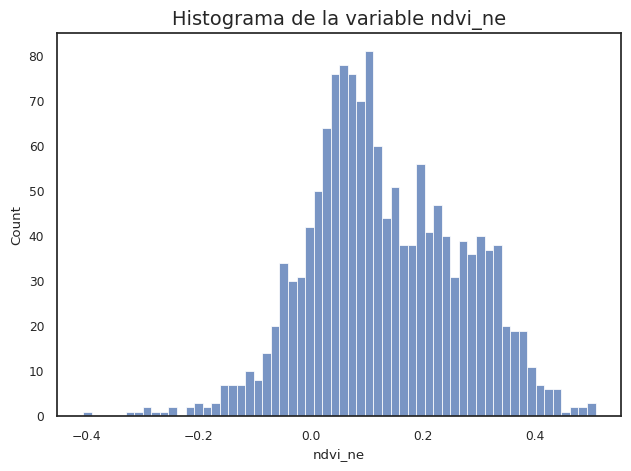

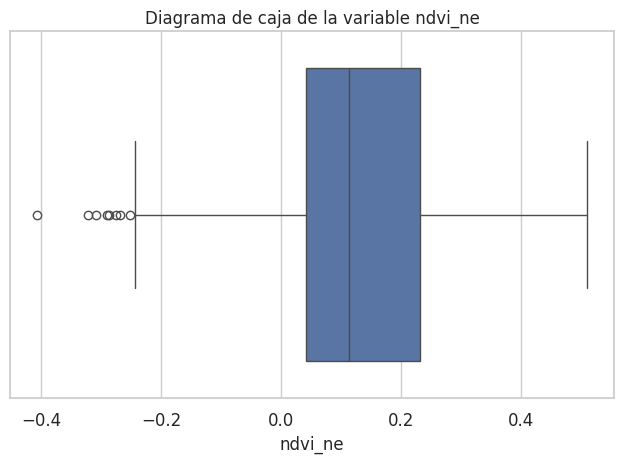

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.03893834134130159
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: -0.0794175152919614
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 1 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean        0.132189
std         0.135925
min        -0.406250
25%         0.041031
50%         0.112475
75%         0.231589
max         0.508357
Name: ndvi_ne, dtype: float64


In [26]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='ndvi_ne')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable ndvi_nw

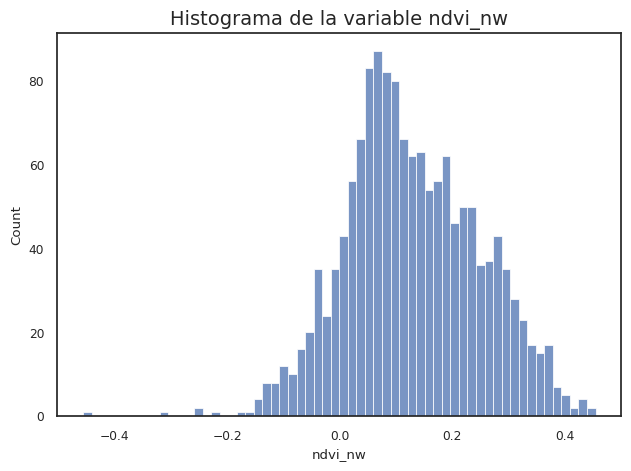

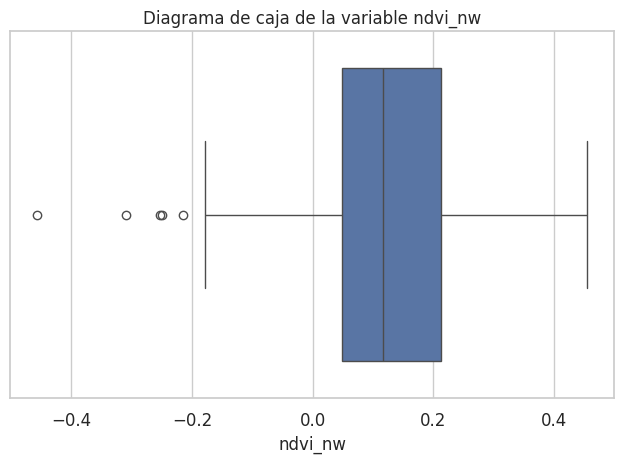

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.022593009786860643
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 0.08588498666352651
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 2 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean        0.128691
std         0.118899
min        -0.456100
25%         0.048375
50%         0.117105
75%         0.213429
max         0.454429
Name: ndvi_nw, dtype: float64


In [27]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='ndvi_nw')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable ndvi_sw

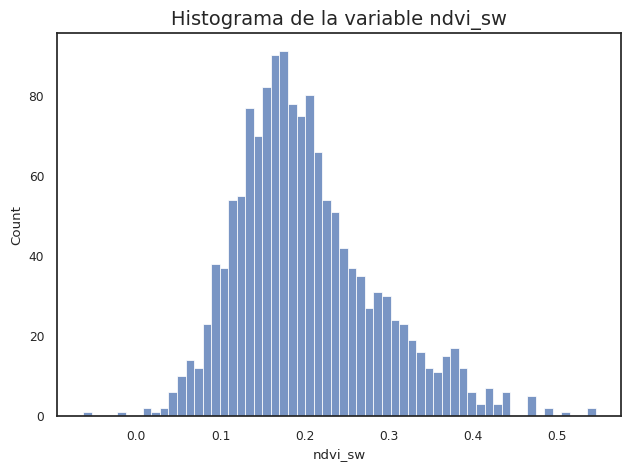

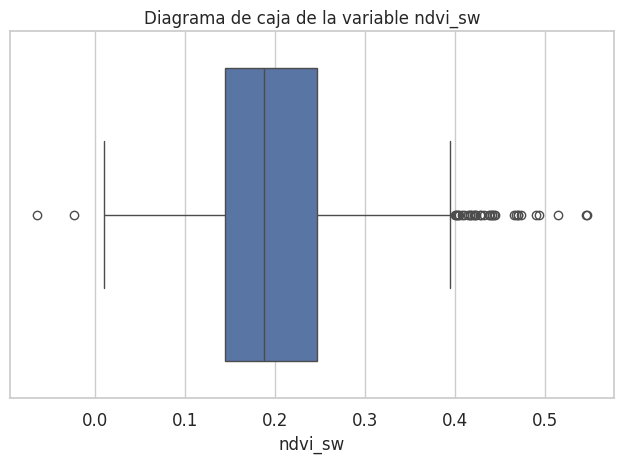

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.768624386070685
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 0.7514625387935987
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 11 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean        0.201940
std         0.083438
min        -0.063457
25%         0.144718
50%         0.187957
75%         0.246775
max         0.546017
Name: ndvi_sw, dtype: float64


In [28]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='ndvi_sw')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable precipitation_amt_mm

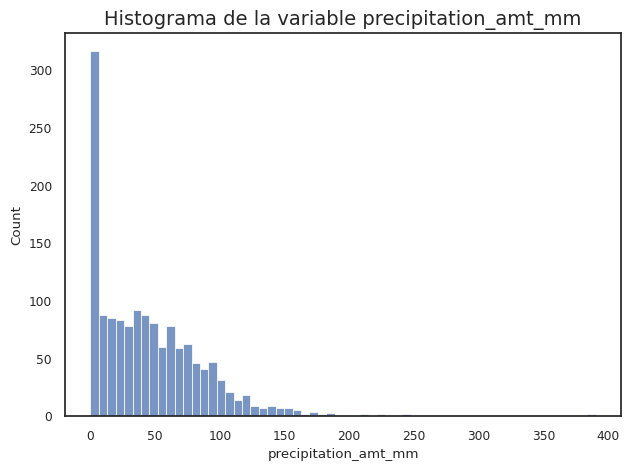

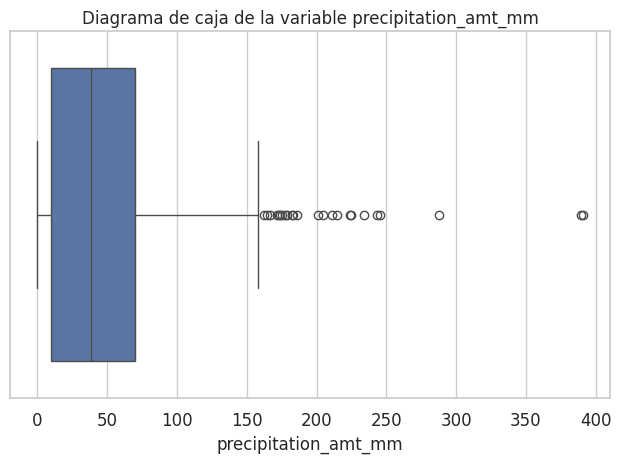

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 1.7440537903855187
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría alta. La distribución es significativamente sesgada.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 6.8535103019580195
 *Interpretación: La distribución es leptocúrtica (colas muy gruesas, muchos outliers)
4) Se ha detectado 12 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       45.747569
std        43.538117
min         0.000000
25%         9.960000
50%        38.170000
75%        70.047500
max       390.600000
Name: precipitation_amt_mm, dtype: float64


In [29]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='precipitation_amt_mm')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_air_temp_k

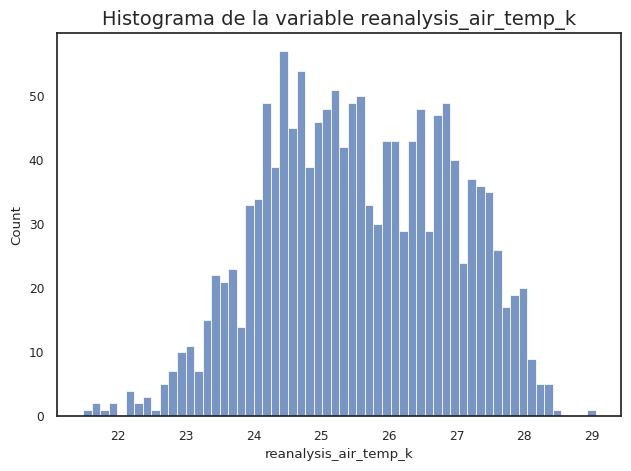

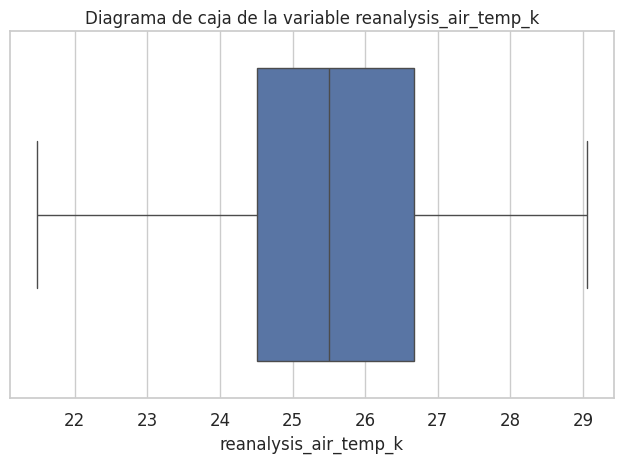

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.08075524585466495
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.6720832807768731
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       25.551467
std         1.358715
min        21.485714
25%        24.515000
50%        25.498571
75%        26.677500
max        29.050000
Name: reanalysis_air_temp_k, dtype: float64


In [30]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_air_temp_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_avg_temp_k

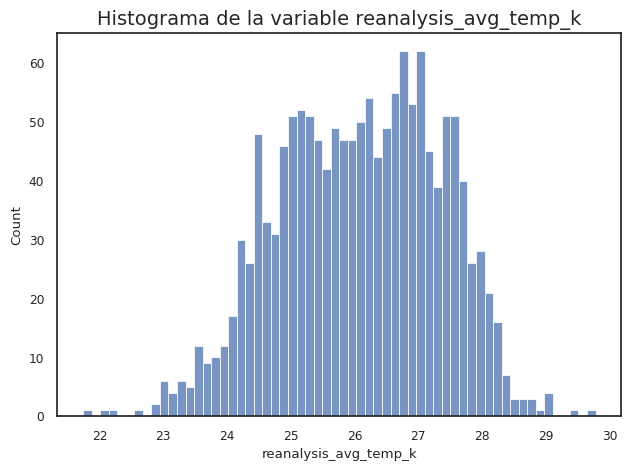

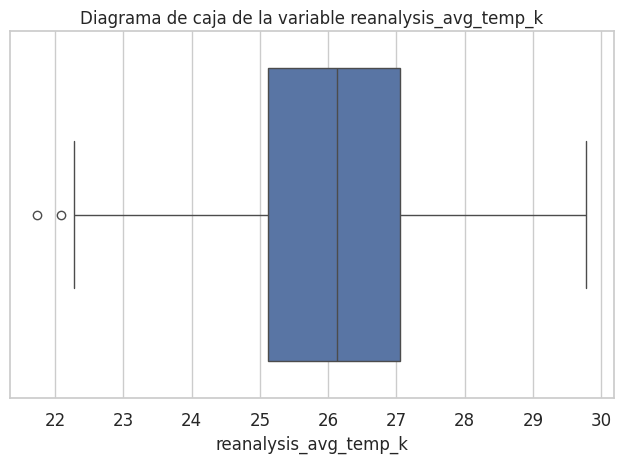

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.19051278211894251
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.5129288627220241
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       26.075714
std         1.257393
min        21.742857
25%        25.114286
50%        26.135714
75%        27.057143
max        29.778571
Name: reanalysis_avg_temp_k, dtype: float64


In [31]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_avg_temp_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_dew_point_temp_k

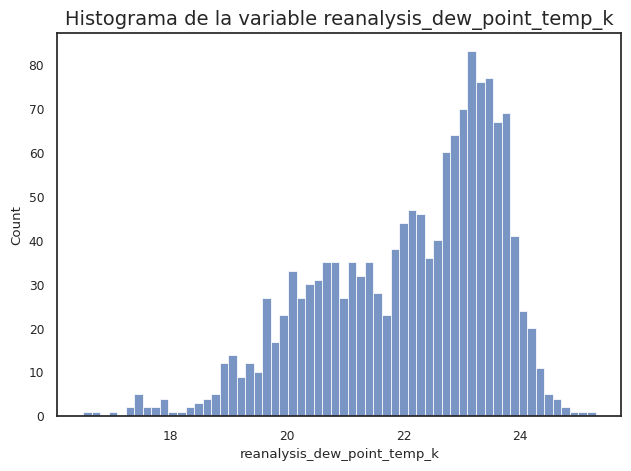

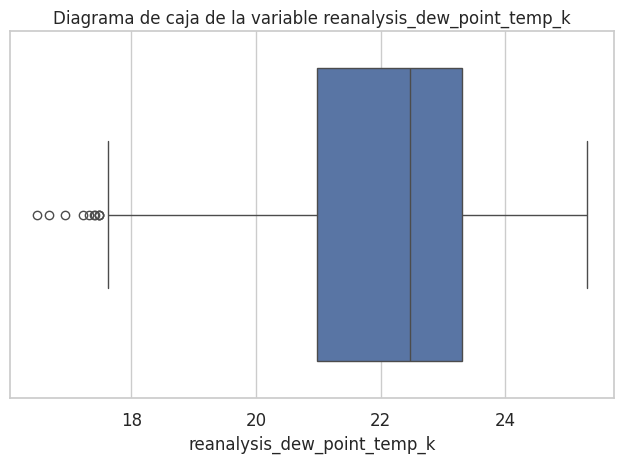

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.7240536370551722
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.0903645346690749
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       22.096491
std         1.522632
min        16.492857
25%        20.980357
50%        22.475714
75%        23.306071
max        25.300000
Name: reanalysis_dew_point_temp_k, dtype: float64


In [32]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_dew_point_temp_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_max_air_temp_k

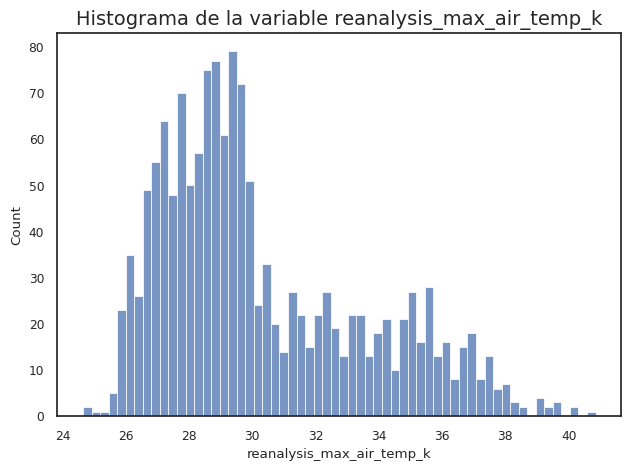

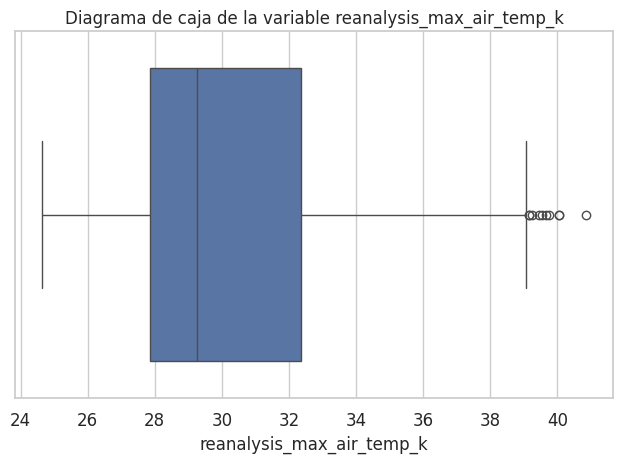

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.845896927136754
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: -0.18863306864798624
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       30.277699
std         3.230577
min        24.650000
25%        27.850000
50%        29.250000
75%        32.350000
max        40.850000
Name: reanalysis_max_air_temp_k, dtype: float64


In [33]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_max_air_temp_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_min_air_temp_k

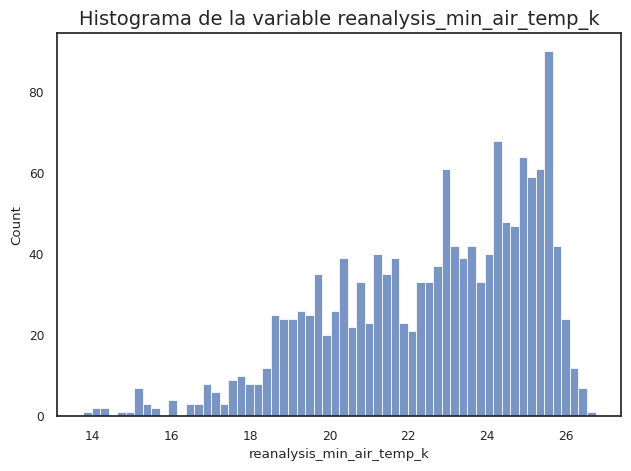

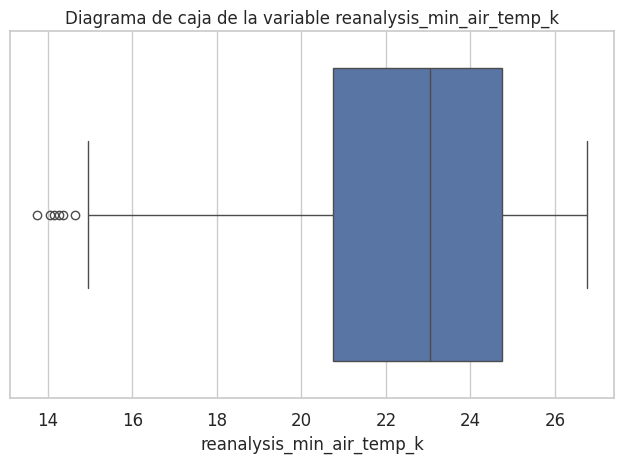

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.6721281931761129
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.21351018828225188
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       22.567808
std         2.562511
min        13.750000
25%        20.750000
50%        23.050000
75%        24.750000
max        26.750000
Name: reanalysis_min_air_temp_k, dtype: float64


In [34]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_min_air_temp_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_precip_amt_kg_per_m2

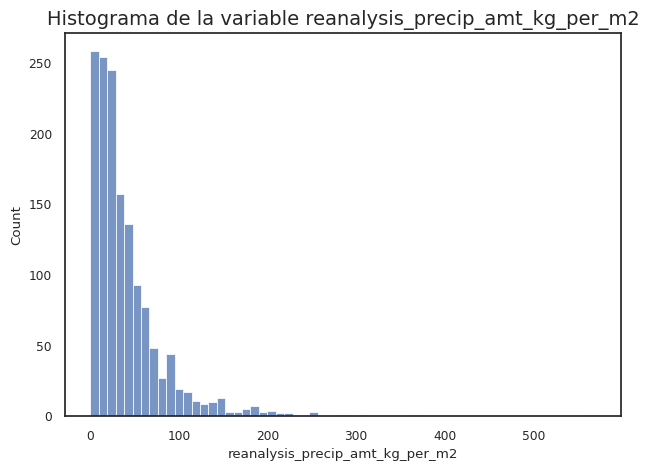

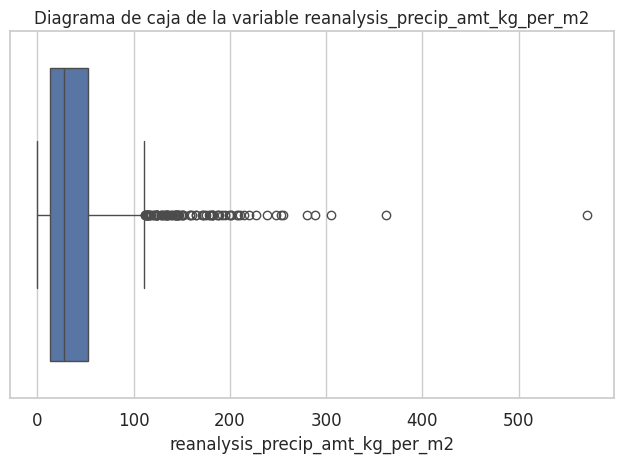

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 3.3742927976156833
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría muy alta. La distribución es extremadamente sesgada.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 22.162817631462364
 *Interpretación: La distribución es leptocúrtica (colas muy gruesas, muchos outliers)
4) Se ha detectado 62 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       40.196827
std        43.388348
min         0.000000
25%        13.200000
50%        27.200000
75%        52.525000
max       570.500000
Name: reanalysis_precip_amt_kg_per_m2, dtype: float64


In [35]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_precip_amt_kg_per_m2')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_relative_humidity_percent

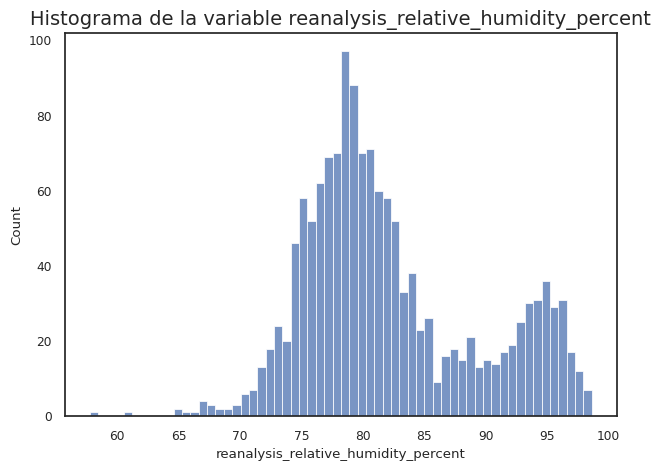

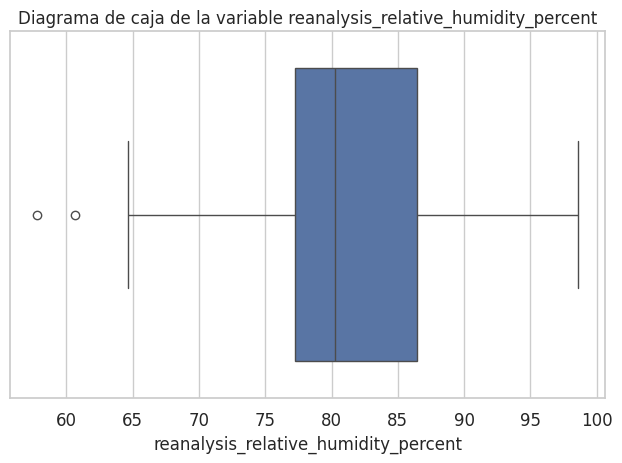

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.5732623383389475
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: -0.3902312296370014
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 1 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       82.165152
std         7.141162
min        57.787143
25%        77.226429
50%        80.287857
75%        86.437500
max        98.610000
Name: reanalysis_relative_humidity_percent, dtype: float64


In [36]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_relative_humidity_percent')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_sat_precip_amt_mm

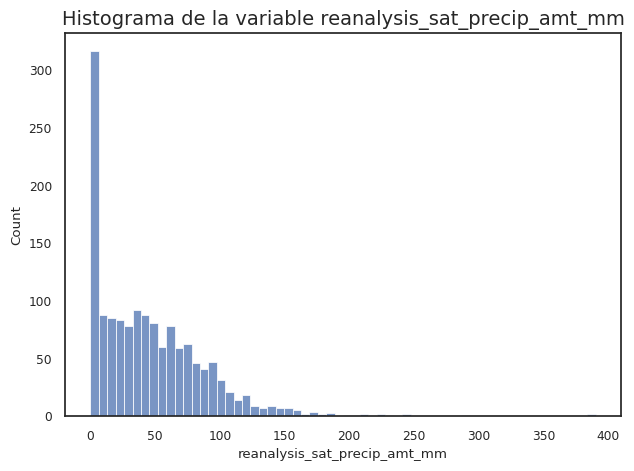

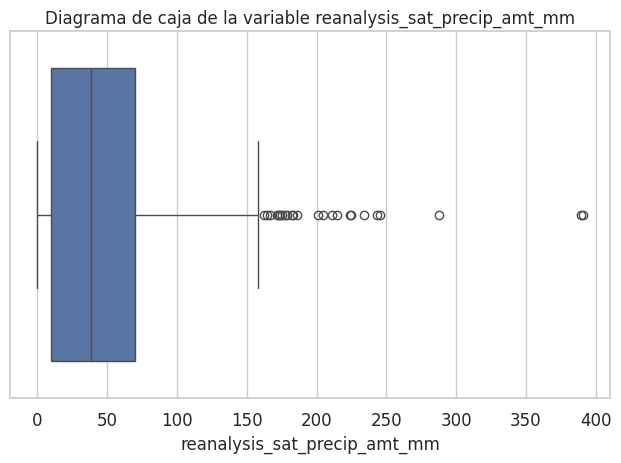

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 1.7440537903855184
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría alta. La distribución es significativamente sesgada.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 6.853510301958016
 *Interpretación: La distribución es leptocúrtica (colas muy gruesas, muchos outliers)
4) Se ha detectado 12 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       45.747569
std        43.538117
min         0.000000
25%         9.960000
50%        38.170000
75%        70.047500
max       390.600000
Name: reanalysis_sat_precip_amt_mm, dtype: float64


In [37]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_sat_precip_amt_mm')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_specific_humidity_g_per_kg

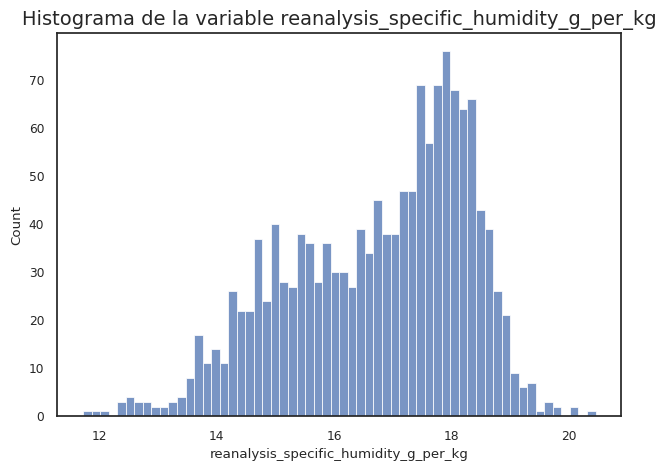

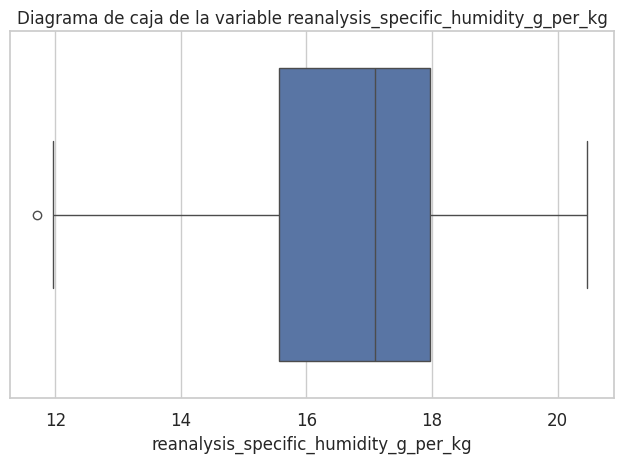

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.5410433822369157
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.4674009171630411
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       16.746348
std         1.537395
min        11.715714
25%        15.561429
50%        17.084286
75%        17.974643
max        20.461429
Name: reanalysis_specific_humidity_g_per_kg, dtype: float64


In [38]:
outlier = outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_specific_humidity_g_per_kg')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable reanalysis_tdtr_k

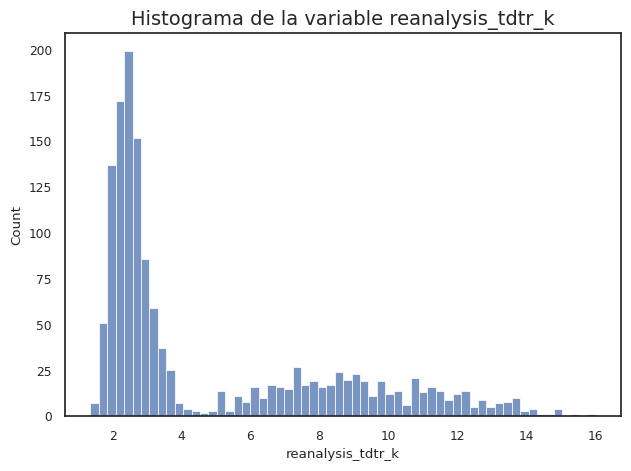

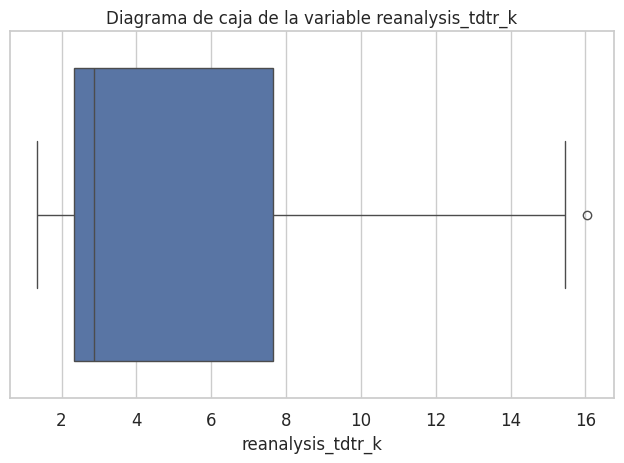

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 1.0673179425275816
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría alta. La distribución es significativamente sesgada.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: -0.20834046057873135
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean        4.905783
std         3.544011
min         1.357143
25%         2.328571
50%         2.857143
75%         7.646429
max        16.028571
Name: reanalysis_tdtr_k, dtype: float64


In [39]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='reanalysis_tdtr_k')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable station_avg_temp_c

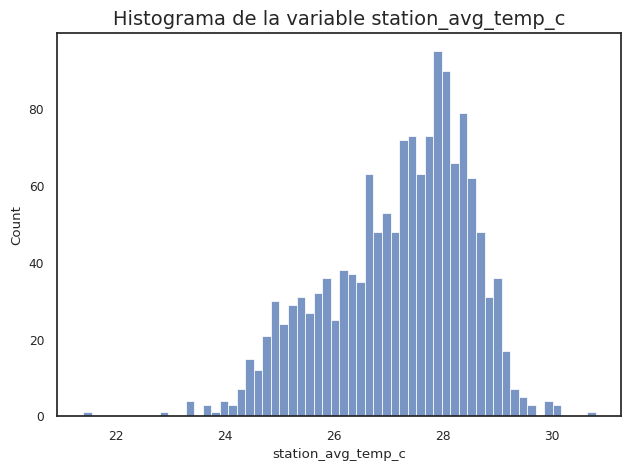

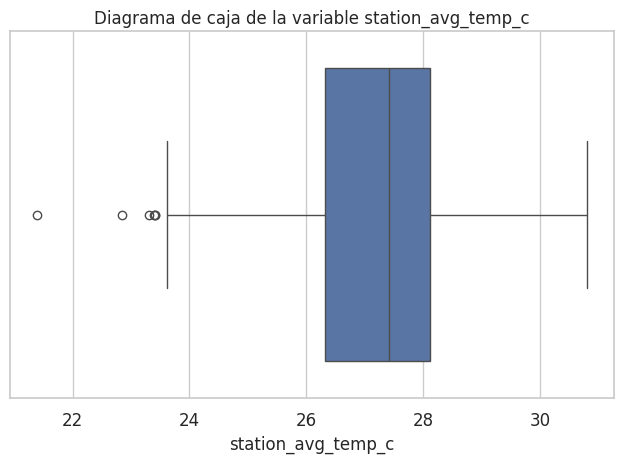

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.5689322734395355
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: -0.1017329748009459
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 1 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       27.184150
std         1.277868
min        21.400000
25%        26.322321
50%        27.414286
75%        28.128571
max        30.800000
Name: station_avg_temp_c, dtype: float64


In [40]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='station_avg_temp_c')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable station_diur_temp_rng_c

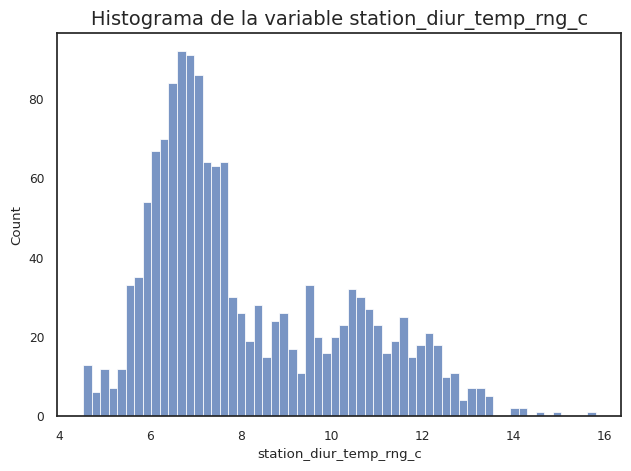

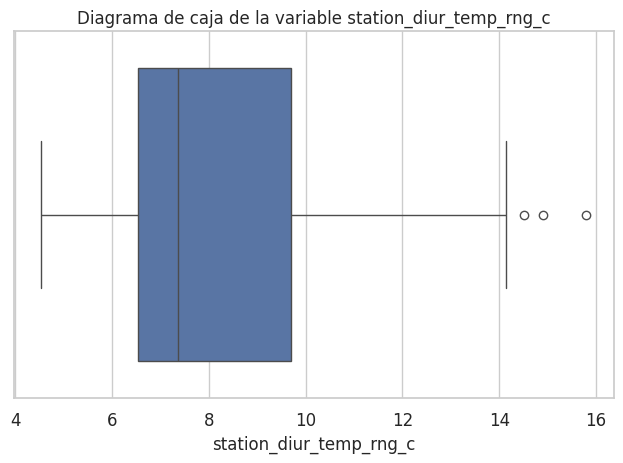

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 0.7880885027697254
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría moderada. La distribución presenta cierta asimetría.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: -0.3666623642390454
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 0 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean        8.112995
std         2.134508
min         4.528571
25%         6.528571
50%         7.371429
75%         9.700000
max        15.800000
Name: station_diur_temp_rng_c, dtype: float64


In [41]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='station_diur_temp_rng_c')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable station_max_temp_c

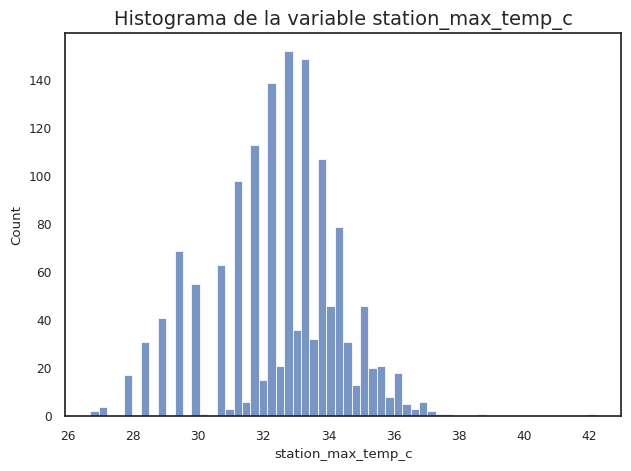

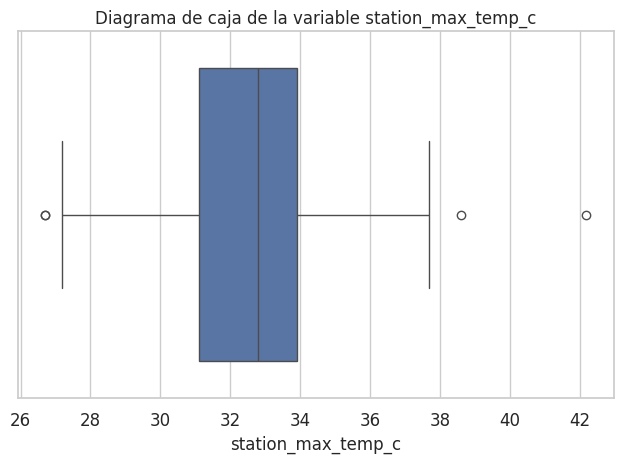

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.27106578001201165
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: 0.24126258295748348
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 1 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       32.460542
std         1.950839
min        26.700000
25%        31.100000
50%        32.800000
75%        33.900000
max        42.200000
Name: station_max_temp_c, dtype: float64


In [42]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='station_max_temp_c')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable station_min_temp_c

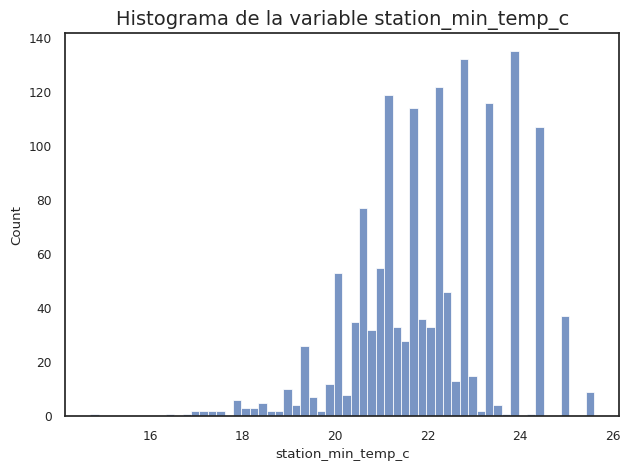

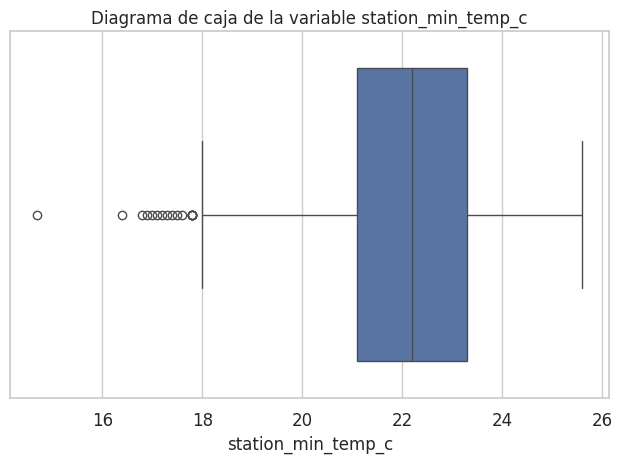

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: -0.3043998971594126
 *Interpretación: La distribución tiene cola larga a la izquierda (asimetría negativa).
 *Interpretación de la magnitud: Asimetría baja. La distribución es casi simétrica.
 *Recomendaciones: Considerar  la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado izquierdo.
3) Kurtosis: 0.2412993296081538
 *Interpretación: La distribución es platicúrtica (colas muy ligeras, valores extremos muy raros)
4) Se ha detectado 2 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       22.099639
std         1.568100
min        14.700000
25%        21.100000
50%        22.200000
75%        23.300000
max        25.600000
Name: station_min_temp_c, dtype: float64


In [43]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='station_min_temp_c')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable station_precip_mm

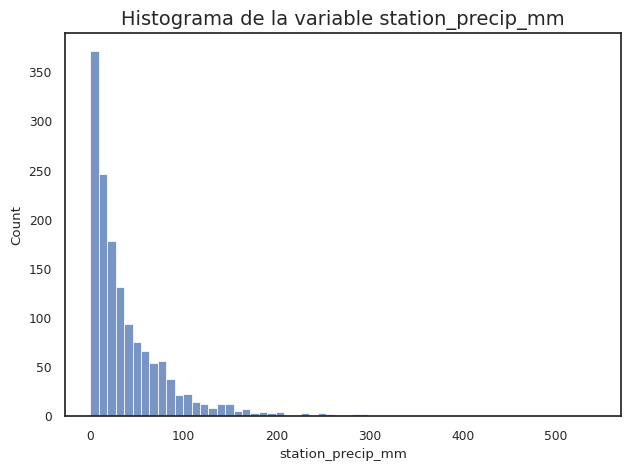

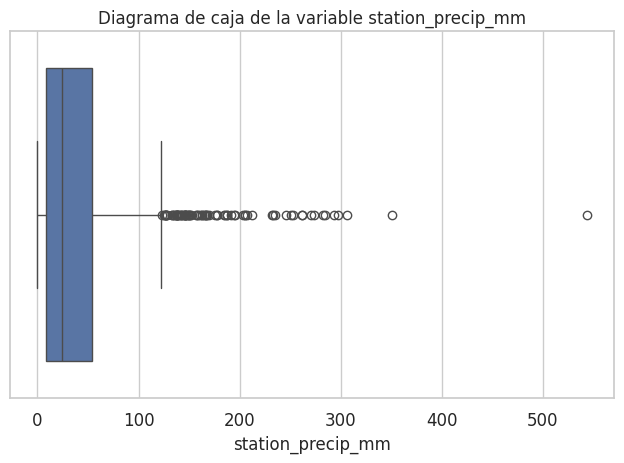

***Resumen de la variable***
1) Los datos no provienen de una distribución normal al nivel de significancia del 5%.
2) Skewness: 2.972072268158726
 *Interpretación: La distribución tiene cola larga a la derecha (asimetría positiva).
 *Interpretación de la magnitud: Asimetría muy alta. La distribución es extremadamente sesgada.
 *Recomendaciones: Considerar usar la mediana en lugar de la media. Se debe de verifica si hay outliers en el lado derecho.
3) Kurtosis: 15.332530936422021
 *Interpretación: La distribución es leptocúrtica (colas muy gruesas, muchos outliers)
4) Se ha detectado 56 outliers en los datos
5) Datos resumidos de la variable
count    1456.000000
mean       39.377207
std        47.305192
min         0.000000
25%         8.700000
50%        23.850000
75%        54.100000
max       543.300000
Name: station_precip_mm, dtype: float64


In [44]:
outlier = analysis_numeric_colum(df=df_temp_cleaned,col='station_precip_mm')
outliers = pd.concat([outliers, pd.DataFrame(outlier,index=[0])], ignore_index=True)

#### Analizando la variable city

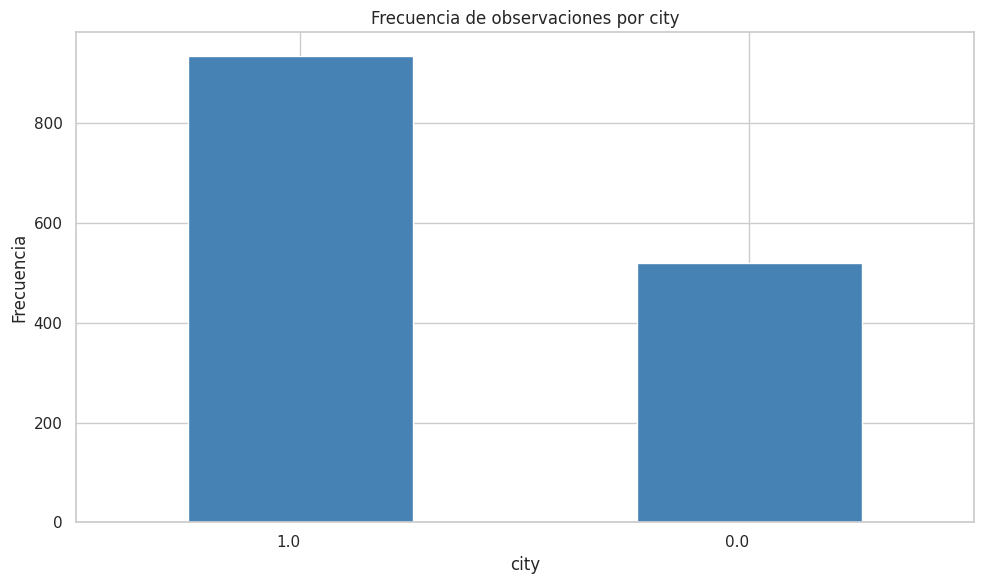

In [45]:
make_histogram(df=df_temp_cleaned,variable='city')

#### Resultados
Se observo de mejor maner la forma de cada una de la varibles de los datos y sus propiedades con el objetivo de conocer como esta la distribución de los datos, su forma y sus medidas de tendencia crentral.

### Detección de outliers en variables numericas continuas
Para realizar el analisis de los datos atipicos en las variables numericas continuas tambien se va a usar el rango intercuantilico, el cual es un método excelente para detectar valores atípicos en un conjunto de datos. \
El valor de k usado en este caso es de `k=2`, este valor es debido a que se tiene una gran cantidad de datos de diferente tipo y lo ideal es reducir la sensibilidad en este caso un 0.5, debido a que no son considerados como errores sino casos especiales de los datos.

In [46]:
#Se imprime las variables con outliers
var_outliers = outliers[outliers['num_outliers']>0]
var_outliers

,variable,num_outliers
0,ndvi_ne,1
1,ndvi_nw,2
2,ndvi_sw,11
3,precipitation_amt_mm,12
9,reanalysis_precip_amt_kg_per_m2,62
10,reanalysis_relative_humidity_percent,1
11,reanalysis_sat_precip_amt_mm,12
14,station_avg_temp_c,1
16,station_max_temp_c,1
17,station_min_temp_c,2


Las variables ndvi_ne, ndvi_nw, ndvi_sw al corresponder a (Normalized difference vegetation index) no se los considera como outliers en nuestros datos pero el resto de variables si son analizadas como cantidatas en la eliminación de outliers.

In [47]:
numerical_columns_outliers = ['precipitation_amt_mm', 'reanalysis_air_temp_k','reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k','reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k','reanalysis_precip_amt_kg_per_m2','reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
                              'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k','station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c','station_min_temp_c', 'station_precip_mm']

detectar_outliers_var(df_temp_cleaned,input_columns=numerical_columns_outliers,k=2)

<ipython-input-25-f96b896e3c96>:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  outliers = pd.concat([outliers, outliers_col], axis=0)


,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
88,1.0,1992.0,2.0,0.100833,0.073575,0.138714,0.112786,200.85,24.762857,24.971429,21.307143,27.25,22.95,18.30,81.300000,200.85,15.878571,2.300000,25.657143,7.500000,30.6,20.6,58.2,1.0
264,1.0,1995.0,21.0,0.032200,0.162133,0.231829,0.240271,204.62,26.304286,26.428571,22.844286,28.55,24.15,17.30,81.447143,204.62,17.412857,2.328571,27.228571,7.342857,31.7,22.2,97.5,5.0
332,1.0,1996.0,38.0,0.055650,0.028450,0.150429,0.107817,243.55,26.332857,26.292857,23.730000,28.15,24.45,151.70,85.690000,243.55,18.407143,1.828571,27.042857,5.828571,31.7,22.8,305.9,9.0
438,1.0,1998.0,40.0,-0.002200,0.038200,0.161886,0.168314,223.61,27.447143,27.607143,23.388571,29.75,25.35,124.40,78.782857,223.61,18.061429,2.800000,27.914286,6.285714,32.8,23.9,24.7,10.0
498,1.0,1999.0,47.0,0.000500,0.071200,0.107700,0.088740,224.90,25.582857,25.728571,23.135714,27.65,23.95,140.20,86.405714,224.90,17.870000,1.900000,26.600000,4.528571,31.7,23.3,88.9,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1314,0.0,2007.0,41.0,0.385186,0.405071,0.310629,0.438129,39.09,26.425714,28.235714,22.297143,36.45,21.65,38.28,80.450000,39.09,17.010000,11.600000,28.400000,10.600000,34.2,21.8,145.1,10.0
1321,0.0,2007.0,48.0,0.165640,0.179300,0.127600,0.181914,129.33,24.730000,26.178571,24.067143,32.05,21.25,65.57,96.522857,129.33,18.924286,6.942857,27.125000,8.350000,32.3,22.4,293.1,11.0
1324,0.0,2007.0,51.0,0.269800,0.275686,0.275514,0.236714,146.13,23.991429,25.092857,23.247143,33.45,20.15,89.72,96.074286,146.13,18.034286,5.685714,27.625000,9.000000,32.9,22.4,261.3,12.0
1338,0.0,2008.0,13.0,0.336600,0.304214,0.322900,0.377314,62.13,23.944286,24.842857,22.798571,30.55,19.95,53.36,94.074286,62.13,17.507143,6.557143,26.900000,8.266667,31.7,22.6,282.7,3.0


#### Detección de outliers por ciudad
Se realiza la detección de esta tipo para no eliminar datos que pueden ser considerados anomalos en una ciudad pero en la otra puedan ser datos normales.

##### Detección de outliers para la ciudad 0

In [48]:
df_temp_cleaned_0=df_temp_cleaned[df_temp_cleaned["city"]==0]
detectar_outliers_var(df_temp_cleaned_0,input_columns=numerical_columns_outliers,k=2)

<ipython-input-25-f96b896e3c96>:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  outliers = pd.concat([outliers, outliers_col], axis=0)


,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
1335,0.0,2008.0,10.0,0.169743,0.138667,0.170057,0.200843,210.83,24.604286,26.185714,22.370000,34.75,20.15,39.10,88.972857,210.83,17.064286,8.957143,27.180000,8.880000,33.3,21.9,119.6,3.0
946,0.0,2000.0,36.0,0.295586,0.295683,0.312214,0.265929,23.12,27.652857,28.785714,17.485714,39.65,18.35,2.50,57.787143,23.12,12.652857,14.900000,28.366667,12.900000,35.8,21.7,56.9,9.0
987,0.0,2001.0,26.0,0.192300,0.275286,0.316457,0.325414,1.22,21.695714,22.850000,17.422857,32.95,15.25,1.82,79.322857,1.22,12.464286,12.342857,25.300119,11.126155,32.3,17.1,31.0,6.0
1242,0.0,2006.0,20.0,0.339286,0.348286,0.315829,0.374571,1.52,22.904286,23.764286,16.938571,32.45,14.05,0.10,72.034286,1.52,12.111429,12.371429,25.200000,11.700000,31.7,19.4,2.0,5.0
1040,0.0,2002.0,27.0,0.101543,0.126600,0.119357,0.076243,3.27,21.485714,21.742857,18.644286,31.95,14.25,6.20,85.565714,3.27,13.454286,8.700000,26.275000,9.500000,32.6,20.7,5.1,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1285,0.0,2007.0,12.0,0.213240,0.223129,0.264371,0.221829,150.33,24.534286,25.578571,22.740000,32.25,19.45,59.20,90.858571,150.33,17.470000,8.171429,27.000000,10.650000,33.9,21.7,252.7,3.0
1290,0.0,2007.0,17.0,0.271371,0.183657,0.203000,0.300600,157.86,24.192857,25.128571,23.352857,31.75,19.75,62.30,95.525714,157.86,18.104286,7.300000,27.033333,7.766667,34.1,22.0,261.7,4.0
1321,0.0,2007.0,48.0,0.165640,0.179300,0.127600,0.181914,129.33,24.730000,26.178571,24.067143,32.05,21.25,65.57,96.522857,129.33,18.924286,6.942857,27.125000,8.350000,32.3,22.4,293.1,11.0
1324,0.0,2007.0,51.0,0.269800,0.275686,0.275514,0.236714,146.13,23.991429,25.092857,23.247143,33.45,20.15,89.72,96.074286,146.13,18.034286,5.685714,27.625000,9.000000,32.9,22.4,261.3,12.0


Se han detectado 64 filas que tienen outliers en los datos para la ciudad 0

##### Detección de outliers para la ciudad 1

In [49]:
df_temp_cleaned_1=df_temp_cleaned[df_temp_cleaned["city"]==1]
detectar_outliers_var(df_temp_cleaned_1,input_columns=numerical_columns_outliers,k=2)

<ipython-input-25-f96b896e3c96>:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  outliers = pd.concat([outliers, outliers_col], axis=0)


,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
88,1.0,1992.0,2.0,0.100833,0.073575,0.138714,0.112786,200.85,24.762857,24.971429,21.307143,27.25,22.95,18.30,81.300000,200.85,15.878571,2.300000,25.657143,7.500000,30.6,20.6,58.2,1.0
108,1.0,1992.0,22.0,0.121500,0.139033,0.219157,0.213014,186.25,25.465714,25.600000,23.184286,28.25,23.85,130.30,87.301429,186.25,17.832857,2.357143,27.428571,5.957143,31.7,23.9,80.2,5.0
264,1.0,1995.0,21.0,0.032200,0.162133,0.231829,0.240271,204.62,26.304286,26.428571,22.844286,28.55,24.15,17.30,81.447143,204.62,17.412857,2.328571,27.228571,7.342857,31.7,22.2,97.5,5.0
265,1.0,1995.0,22.0,0.140597,0.241200,0.102471,0.109571,178.89,26.452857,26.457143,22.842857,28.85,24.95,20.33,80.727143,178.89,17.411429,1.957143,27.700000,7.328571,33.3,23.3,9.1,6.0
303,1.0,1996.0,9.0,0.076000,0.108975,0.269933,0.222771,177.58,24.448571,24.557143,20.581429,26.45,22.85,15.67,79.198571,177.58,15.128571,2.300000,25.557143,7.214286,29.4,21.1,4.6,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
818,1.0,2006.0,3.0,-0.194233,-0.111740,0.101514,0.101114,74.41,25.251429,25.378571,21.267143,27.75,23.55,41.50,78.720000,74.41,15.794286,2.428571,24.714286,6.357143,30.6,20.6,101.1,1.0
846,1.0,2006.0,31.0,-0.114500,0.099550,0.152329,0.153129,93.78,27.250000,27.321429,23.808571,29.55,25.25,72.24,81.645714,93.78,18.427143,2.800000,27.828571,6.271429,32.2,22.8,100.0,8.0
857,1.0,2006.0,42.0,0.123350,0.115200,0.070271,0.058429,64.15,27.605714,27.621429,23.694286,29.75,25.45,37.00,79.414286,64.15,18.394286,3.028571,28.357143,7.528571,33.3,23.9,140.8,10.0
883,1.0,2007.0,17.0,0.021600,0.020550,0.097443,0.064200,69.70,25.872857,26.100000,22.341429,29.65,23.75,63.10,81.112857,69.70,16.907143,3.357143,26.871429,7.428571,34.4,21.7,163.1,4.0


Se han detectado 88 filas que tienen outliers en los datos para la ciudad 1

##### Eliminación de los outliers por ciudad
Se decide eliminar las filas que tengan outliers por ciudad ya que no representan un margen muy amplio dentro del conjunto de datos

In [50]:
#Eliminación de los outliers del dataframe
df_cleaned_0 = eliminar_outliers_iqr_multi(df_temp_cleaned_0,numerical_columns_outliers,2)
df_cleaned_1 = eliminar_outliers_iqr_multi(df_temp_cleaned_1,numerical_columns_outliers,2)
df_temp_cleaned = pd.concat([df_cleaned_0, df_cleaned_1], ignore_index=True, sort=False)
df_temp_cleaned.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month
0,0.0,2000.0,26.0,0.192886,0.132257,0.340886,0.247200,25.41,23.590000,25.300000,22.034286,34.15,19.95,43.19,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,7.0
1,0.0,2000.0,27.0,0.216833,0.276100,0.289457,0.241657,60.61,23.484286,25.278571,22.208571,33.45,17.95,46.00,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,7.0
2,0.0,2000.0,28.0,0.176757,0.173129,0.204114,0.128014,55.52,23.265714,24.242857,22.472857,31.35,19.45,64.77,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,7.0
3,0.0,2000.0,30.0,0.328643,0.322129,0.254371,0.361043,62.76,23.282857,24.485714,20.807143,33.85,18.35,31.80,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,7.0
4,0.0,2000.0,32.0,0.312486,0.329986,0.380586,0.387271,89.37,24.170000,25.828571,20.671429,35.65,18.95,26.68,83.275714,89.37,15.311429,11.471429,27.016667,11.650000,34.0,19.9,72.9,8.0


De esta manera se han eliminado los outliers de nuestro dataset tomando en cuenta los subgrupos de datos que en este caso el mas relevantes es la ciudad.

### Analisis bivariante
Se realiza el analisis bivariante para determinar si existe una asociación entre las variables y, en caso afirmativo, describir la naturaleza y el grado de esa relación.

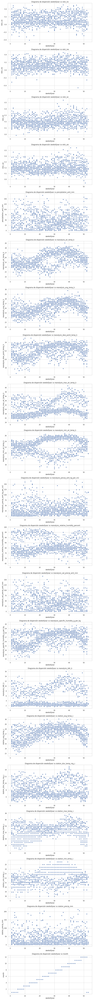

In [51]:
columns_to_plot = df_temp_cleaned.columns[3:]
num_columns = len(columns_to_plot)
fig, axes = plt.subplots(nrows=num_columns, figsize=(10, 5 * num_columns))

# Graficar cada columna contra 'weekofyear'
for i, col in enumerate(columns_to_plot):
    sns.scatterplot(
        data=df_temp_cleaned,
        x='weekofyear',
        y=col,
        ax=axes[i]
    )
    axes[i].set_title(f'Diagrama de dispersión weekofyear vs {col}')
    axes[i].set_xlabel('weekofyear')
    axes[i].set_ylabel(col)

plt.tight_layout()
plt.show()

#### Resultados
En el analisis bivariante se observa como las variables van cambiando a lo largo del tiempo y como cambia el número total de casos reportados

### Analisis multivariable
Se realiza el analisis multivariable para el analisis de las relaciones que se tienen entre todas las variables numericas del dataframe

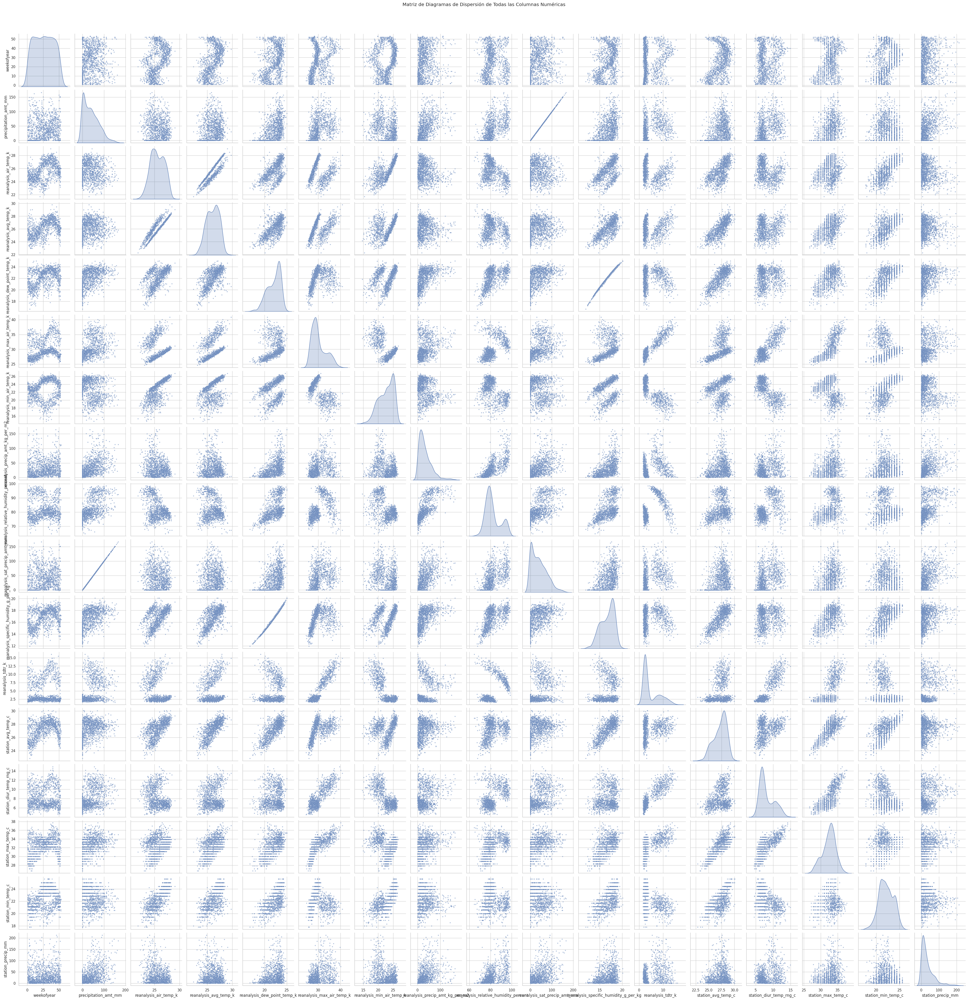

In [52]:
numerical_columns = ['weekofyear','precipitation_amt_mm', 'reanalysis_air_temp_k','reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k','reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k','reanalysis_precip_amt_kg_per_m2','reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
                              'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k','station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c','station_min_temp_c', 'station_precip_mm']


# Crear la matriz de gráficos de dispersión
sns.pairplot(df_temp_cleaned[numerical_columns], diag_kind='kde', plot_kws={'alpha': 0.5, 's': 10})

# Mostrar la gráfica
plt.suptitle('Matriz de Diagramas de Dispersión de Todas las Columnas Numéricas', y=1.02)
plt.show()

#### Matriz de correlación

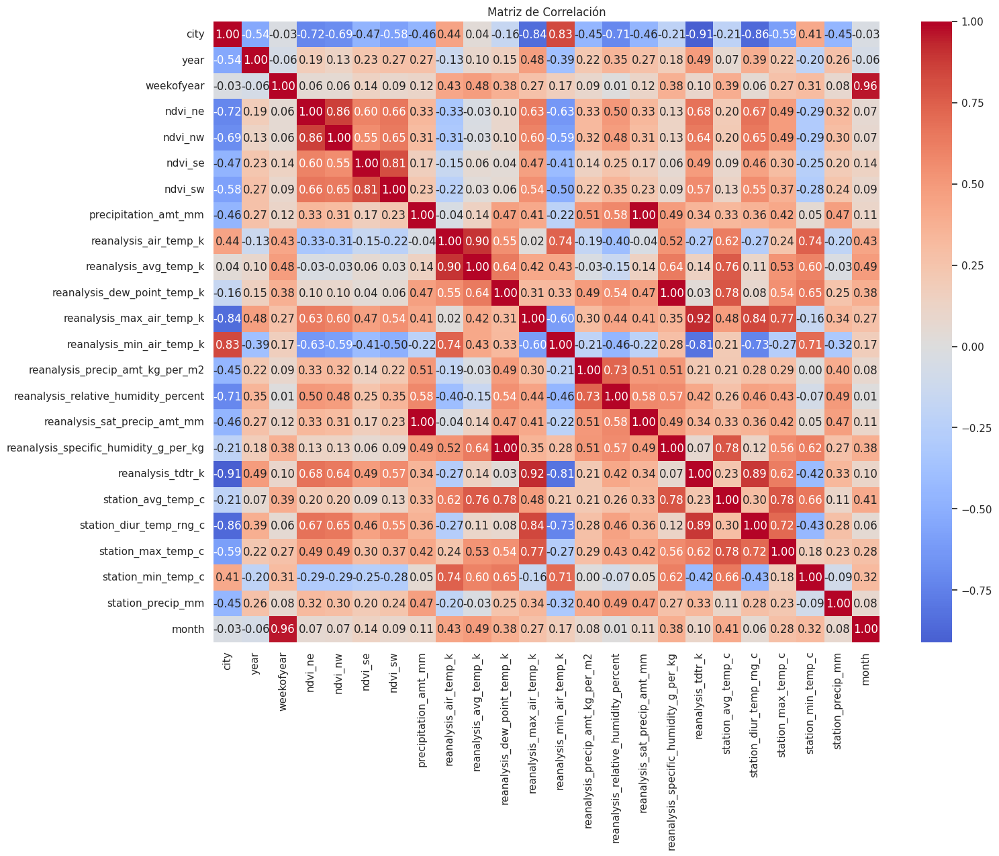

In [53]:
column_analisys = ['city', 'year', 'weekofyear', 'ndvi_ne', 'ndvi_nw', 'ndvi_se',
'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
'reanalysis_precip_amt_kg_per_m2',
'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
'station_min_temp_c', 'station_precip_mm', 'month']

matriz_correlacion = df_temp_cleaned[column_analisys].corr()

plt.figure(figsize=(16, 12))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', center=0, fmt=".2f")
plt.title('Matriz de Correlación')
plt.show()

De esta manera se ha analizado el dataframe realizando un preprocesamiento cuando ha sido necesario para tener una mejor calidad de datos y puedan ser interpretados de mejor manera por los algoritmos de machine learning

---
## Características
---

### Analisis de caracteristicas

#### Transponer el Dataset

In [54]:
# Transponer el dataset
df_transpuesto = df_temp_cleaned.T
df_transpuesto.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [55]:
# Renombrar las columnas
df_transpuesto.columns = [f'Var_{i}' for i in range(df_transpuesto.shape[1])]
print(df_transpuesto.info())
print(df_transpuesto.describe())

<class 'pandas.core.frame.DataFrame'>
Index: 24 entries, city to month
Columns: 1304 entries, Var_0 to Var_1303
dtypes: float64(1304)
memory usage: 245.2+ KB
None
             Var_0        Var_1        Var_2        Var_3        Var_4  \
count    24.000000    24.000000    24.000000    24.000000    24.000000   
mean    102.680045   108.093363   107.612266   105.164484   110.317732   
std     404.609132   403.658900   403.765547   404.211311   403.465199   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       6.000000     9.485714     7.289286     6.250000    10.603571   
50%      21.367143    22.846429    22.869286    19.953571    22.420714   
75%      26.100000    37.000000    34.275000    32.175000    34.412500   
max    2000.000000  2000.000000  2000.000000  2000.000000  2000.000000   

             Var_5        Var_6        Var_7        Var_8        Var_9  \
count    24.000000    24.000000    24.000000    24.000000    24.000000   
mean    104.975930   1

#### Eliminar outliers del dataframe

In [56]:
# Calculo del rango intercuartilico
Q1 = df_transpuesto.quantile(0.25)
Q3 = df_transpuesto.quantile(0.75)
IQR = Q3 - Q1
# Identificar los outliers
outliers_iqr = ((df_transpuesto < (Q1 - 1.5 * IQR)) | (df_transpuesto > (Q3 + 1.5 * IQR)))
# Eliminar las filas
df_transpuesto_sin_outliers = df_transpuesto[~outliers_iqr.any(axis=1)]
print("Dataset sin outliers usando IQR:")
print(df_transpuesto_sin_outliers)

Streaming output truncated to the last 5000 lines.

                                         Var_555    Var_556    Var_557  \
city                                    1.000000   1.000000   1.000000   
weekofyear                             18.000000  19.000000  20.000000   
ndvi_ne                                 0.012500   0.108750   0.101875   
ndvi_nw                                 0.063500   0.216900  -0.008800   
ndvi_se                                 0.070314   0.182329   0.142067   
ndvi_sw                                 0.089443   0.207357   0.125900   
reanalysis_air_temp_k                  25.047143  25.185714  25.184286   
reanalysis_avg_temp_k                  25.371429  25.292857  25.364286   
reanalysis_dew_point_temp_k            20.250000  21.071429  21.125714   
reanalysis_max_air_temp_k              28.950000  28.950000  27.250000   
reanalysis_min_air_temp_k              22.450000  22.850000  23.250000   
reanalysis_specific_humidity_g_per_kg  14.900000  15.750000 

#### Clustering
Se utiliza métodos de aprendizaje no supervisado para seleccionar las caracteristicas más relevantes de los datos y poder usarlas en el clustering

In [57]:
def elbow_method(X, max_k=10):
    """
    Calcula y grafica el método del codo para determinar el número óptimo de clústeres.

    Parámetros:
    - X: array-like, matriz de datos de entrada.
    - max_k: int, número máximo de clústeres a evaluar.

    Retorno:
    - inertia_values: lista de los valores de inercia para cada valor de k.
    """
    inertia_values = []
    k_values = range(1, max_k+1)  # Probar entre 1 y max_k clústeres

    # Calcular la inercia para cada valor de k
    for k in k_values:
        kmeans = cluster.KMeans(n_clusters=k, random_state=seed)
        kmeans.fit(X)
        inertia_values.append(kmeans.inertia_)

    # Graficar el método del codo
    plt.plot(k_values, inertia_values, marker='o')
    plt.xlabel('Número de Clústeres (k)')
    plt.ylabel('Inercia')
    plt.title('Método del Codo para encontrar el número óptimo de Clústeres')
    plt.show()

def calcular_silhouette(x, c):
    fig, ax = plt.subplots(1, 2, figsize=(20, 5), sharey=True)

    metodos = [cluster_ac, cluster_kmeans]
    for i, metodo in enumerate(metodos):
        res = []
        for num in range(2, c):
            # Calcular las etiquetas de clustering usando el método correspondiente
            labels = metodo(x, num)
            # Calcular el score de Silhouette para el número actual de clusters
            res.append(silhouette_score(x, labels))

        ax[i].plot(range(2, c), res)
        ax[i].set_xlabel("n clusters")
        ax[i].set_ylabel("silhouette score")
        ax[i].set_title('Agglomerative Clustering' if i == 0 else "K-Means")


def cluster_ac(x, n_clusters):
    #Agrupa los objetos similares para formar un cluster que esta usando la distancia euclidiana para formar el cluster
    #Con linkage='ward' se utiliza la minimizacion de la variaza de dos clusters ward es para 2
    ac = cluster.AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    #Se realiza el entrenamientio
    ac.fit(x)
    return ac.labels_

def cluster_kmeans(x, n_clusters):
    #Agrupa objetos basandose en la cantidad de clusters
    return cluster.k_means(x, n_clusters=n_clusters,random_state=seed)[1]

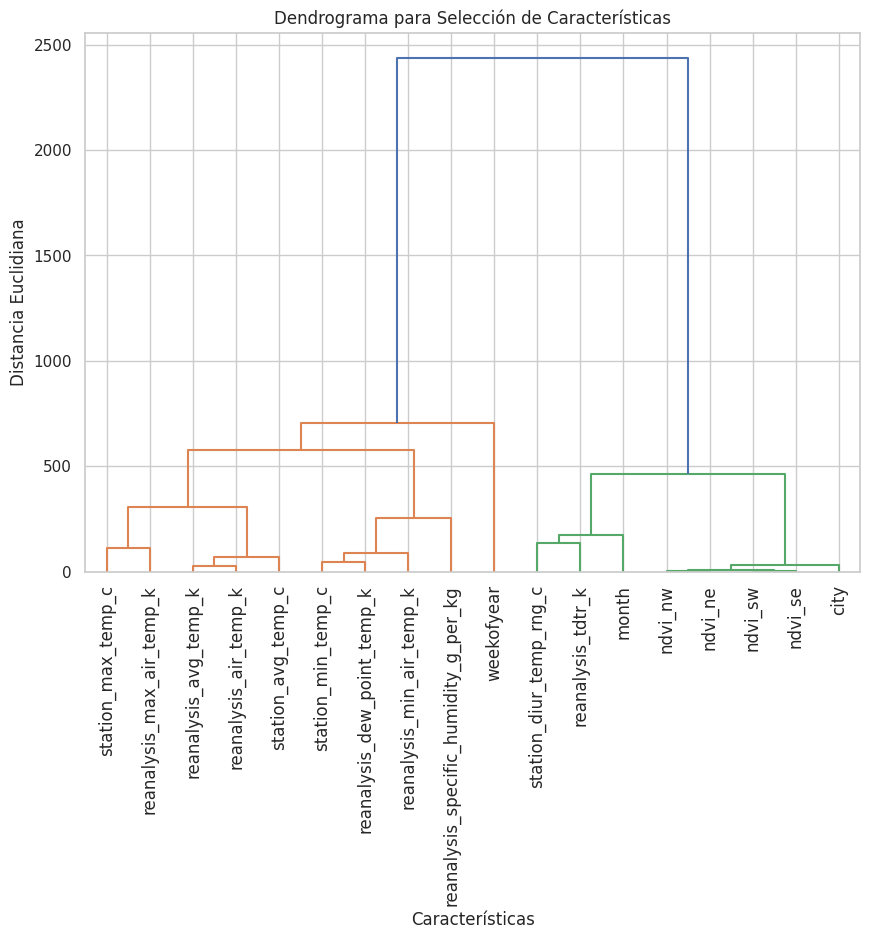

In [58]:
# Aplicar el clustering jerárquico
Z = linkage(df_transpuesto_sin_outliers, method='ward')

plt.figure(figsize=(10, 7))
dendrogram(Z, labels=df_transpuesto_sin_outliers.index, orientation='top', distance_sort='descending')
plt.title("Dendrograma para Selección de Características")
plt.xlabel("Características")
plt.xticks(rotation=90)
plt.ylabel("Distancia Euclidiana")
plt.show()

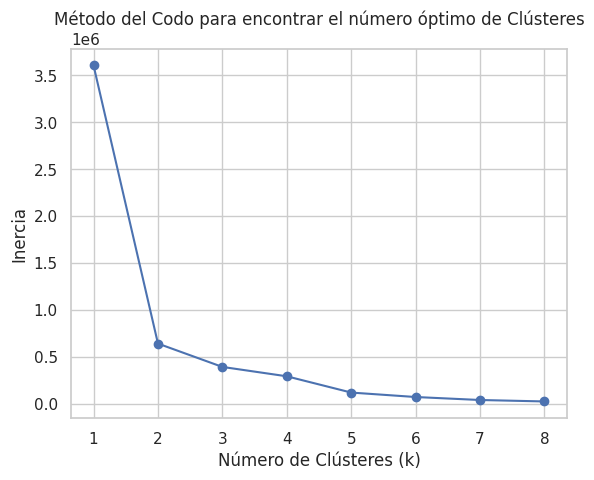

In [59]:
elbow_method(df_transpuesto_sin_outliers, max_k=8)

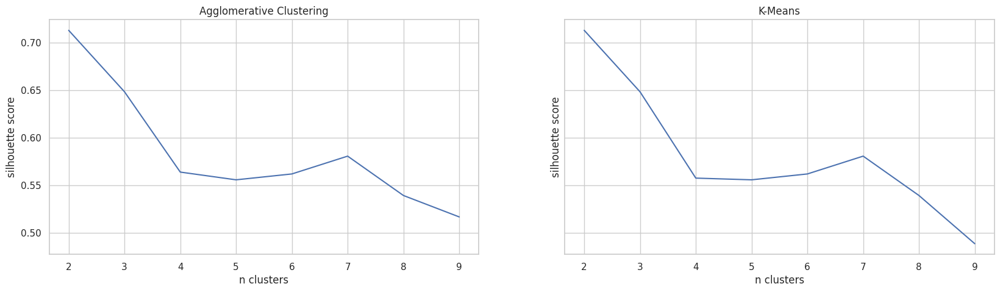

In [60]:
calcular_silhouette(df_transpuesto_sin_outliers, 10)

Después de revisar los clusters obtenidos el valor de las caracteristicas muestra un valor de 4 cluster si se obsera en la metrica de elbow code y un valor de 2 en el solhoutte score, analizando detalladamente y tomando en cuenta que 2 caracteristicas podria no ser adecuadas para una selección correcta de cluster y además se observa que en el silhoutte score se da un pico de en `7` clusters por lo que se va a analizar y tomar este valor para la referencia del número de clustes.

#### Características importantes del clustering
Se selecciona las caracteristicas más importantes que estan en cada tipo de cluster analisado

##### Cluster jerarquico

In [61]:
best_t = None
best_score = -1

# Probar diferentes valores de t y ver cuál maximiza el índice de silueta
for t in np.arange(2, 15, 0.25):  # Ajusta el rango según tus datos
    clusters = fcluster(Z, t=t, criterion='distance')
    if len(set(clusters)) > 1:
        score = silhouette_score(df_transpuesto_sin_outliers, clusters)
        if score > best_score:
            best_score = score
            best_t = t

# Mostrar el mejor valor de t y el índice de silueta correspondiente
print("El mejor valor de t:", best_t)
print("Mejor índice de silueta:", best_score)

El mejor valor de t: 6.25
Mejor índice de silueta: 0.19074850569686883


In [62]:
# Determinar los clusters con un umbral de distancia
df_jerarquico = df_transpuesto_sin_outliers.copy()
clusters = fcluster(Z, t=best_t, criterion='distance')
df_jerarquico['Cluster'] = clusters

# Visualizar las características ordenamos los datos por cluster para ver las caracteristicas de los cluster repetidos
caracteristicas_jerarquico = df_jerarquico['Cluster']
caracteristicas_jerarquico = caracteristicas_jerarquico.reset_index().sort_values(by='Cluster')
caracteristicas_jerarquico

,index,Cluster
2,ndvi_ne,1
3,ndvi_nw,1
4,ndvi_se,1
5,ndvi_sw,1
0,city,2
12,reanalysis_tdtr_k,3
14,station_diur_temp_rng_c,4
17,month,5
8,reanalysis_dew_point_temp_k,6
16,station_min_temp_c,7


##### K-Means

In [63]:
n_cluster_caracteristicas = 7
df_k_means = df_transpuesto_sin_outliers.copy()
df_k_means['Cluster'] = cluster_kmeans(df_k_means,n_cluster_caracteristicas)
caracteristicas_k_means = df_k_means['Cluster']
caracteristicas_k_means = caracteristicas_k_means.reset_index().sort_values(by='Cluster')
caracteristicas_k_means

,index,Cluster
6,reanalysis_air_temp_k,0
7,reanalysis_avg_temp_k,0
13,station_avg_temp_c,0
0,city,1
2,ndvi_ne,1
3,ndvi_nw,1
4,ndvi_se,1
5,ndvi_sw,1
1,weekofyear,2
14,station_diur_temp_rng_c,3


##### Cluster aglomerativo

In [64]:
df_aglomerative = df_transpuesto_sin_outliers.copy()
df_aglomerative['Cluster'] = cluster_ac(df_aglomerative,n_cluster_caracteristicas)
caracteristicas_aglomerative = df_aglomerative['Cluster']
caracteristicas_aglomerative = caracteristicas_aglomerative.reset_index().sort_values(by='Cluster')
caracteristicas_aglomerative

,index,Cluster
17,month,0
14,station_diur_temp_rng_c,0
12,reanalysis_tdtr_k,0
15,station_max_temp_c,1
9,reanalysis_max_air_temp_k,1
13,station_avg_temp_c,2
6,reanalysis_air_temp_k,2
7,reanalysis_avg_temp_k,2
10,reanalysis_min_air_temp_k,3
8,reanalysis_dew_point_temp_k,3


Del analisis anterior de las caracteristicas de cada cluster y tomando en cuenta la información que representa cada caracteristica se ha optado por seleccionar las siguientes:

+ `reanalysis_avg_temp_k`: Temperatura promedio obtenida a través de un proceso de reanálisis climático.
+ `city`: Ciudad de donde se esta haciendo el analisis
+ `weekofyear`: Semana del año donde en la cual se esta obteniendo los datos
+ `station_diur_temp_rng_c`: El rango de temperatura, medido en una estación meteorológica. Un rango diurno alto indica una gran variación de temperatura entre el día.
+ `reanalysis_dew_point_temp_k`: Es un indicador de la humedad en el aire; valores más altos indican un mayor contenido de humedad.
+ `reanalysis_max_air_temp_k`: Temperatura máxima del aire obtenida a partir de un proceso de reanálisis climático
+ `reanalysis_specific_humidity_g_per_kg`: Humedad específica obtenida a partir de un proceso de reanálisis climático


De las caracteristicas seleccionadas en el analisis anterior se puede observar que los `indices de vegetación de diferencia normalizada (NDVI)` aparecen como caracteristicas que permiten diferenciar un cluster por lo que estas variables influyen y van a ser analizadas para tener una variable que junte todas esas caracteristicas.

### Creación de nuevas variables

#### Crear columnas en el dataframe después del analisis
Se ha creado la columna que dada su naturaleza se considera pertienentes para enriquecer en análisis y comparar las caracteristicas que aportan mayor información.
+ NDVI promedio: calcula el promedio de los valores de NDVI (índice de vegetación) de los cuadrantes para obtener una visión general de la vegetación en toda la ciudad.

In [65]:
# Se crea la columna NDVI promedio
df_dengue = df_temp_cleaned.copy()
df_dengue['ndvi_avg'] = df_dengue[['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw']].mean(axis=1)

### Selección de caracteristicas relevantes para el analisis de clustering
De las caracteristicas resultantes del analisis como se menciono se puede destacar los indices de vegetación normalizada importantes para el analisis es por ellos que para tener una idea general de como esta el indice en todas las zonas de la ciudad se calcula el promedio del mismo por lo que la variable `NDVI Promedio` es una de las variables.

In [66]:
var_selected = ['reanalysis_avg_temp_k','city','weekofyear','station_diur_temp_rng_c','reanalysis_dew_point_temp_k','reanalysis_max_air_temp_k',
               'reanalysis_specific_humidity_g_per_kg','ndvi_avg']

#### Normalización de los datos
Se va a normalizar los datos de las variables númericas para que los algoritmos no se vean afectado por las escalas, para ello se va a usar RobustScaler que es util para manejar datos atipicos ayudando a manejar mejor los valores extremos de los datos, tomando en cuenta que algunos valores extremos que no eran incorrectos sino eran datos inusuales dentro del conjunto.

In [67]:
dict_scaler = {} #Para guardar el escalado de los datos realizados
df_scaled = df_dengue[var_selected]
for col in df_scaled.columns:
    scaler = RobustScaler()
    df_scaled[col] = scaler.fit_transform(df_scaled[[col]])
    dict_scaler[col]=scaler

# Datos transformados
df_scaled

<ipython-input-67-011cff5e049e>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled[col] = scaler.fit_transform(df_scaled[[col]])
<ipython-input-67-011cff5e049e>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled[col] = scaler.fit_transform(df_scaled[[col]])
<ipython-input-67-011cff5e049e>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.p

,reanalysis_avg_temp_k,city,weekofyear,station_diur_temp_rng_c,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_specific_humidity_g_per_kg,ndvi_avg
0,-0.451589,-1.0,0.000000,1.092880,-0.157631,1.065217,-0.149890,0.641310
1,-0.462538,-1.0,0.038462,1.348154,-0.083523,0.913043,-0.062895,0.859336
2,-0.991735,-1.0,0.076923,1.315909,0.028853,0.456522,0.042910,0.186418
3,-0.867647,-1.0,0.153846,1.320209,-0.679423,1.000000,-0.646583,1.335721
4,-0.181516,-1.0,0.230769,1.375025,-0.737130,1.391304,-0.701249,1.619308
...,...,...,...,...,...,...,...,...
1299,-1.214362,0.0,-0.500000,-0.515922,-1.470919,-0.586957,-1.387215,0.112935
1300,-0.564727,0.0,-0.461538,-0.184258,-0.986181,-0.565217,-0.968112,-0.897801
1301,-0.904143,0.0,-0.423077,-0.538955,-1.200000,-0.652174,-1.165026,-1.015654
1302,-0.794654,0.0,-0.384615,-0.368516,-1.394989,-0.586957,-1.299045,-0.326626


### Relación entre variables
Se realiza el analisis de la correlación entre variables tomando un umbral de correlación para definir qué tan alta debe ser la correlación para considerar variables como redundantes (0.8). Luego, elimina las variables de cada par de alta correlación, manteniendo solo una de ellas.

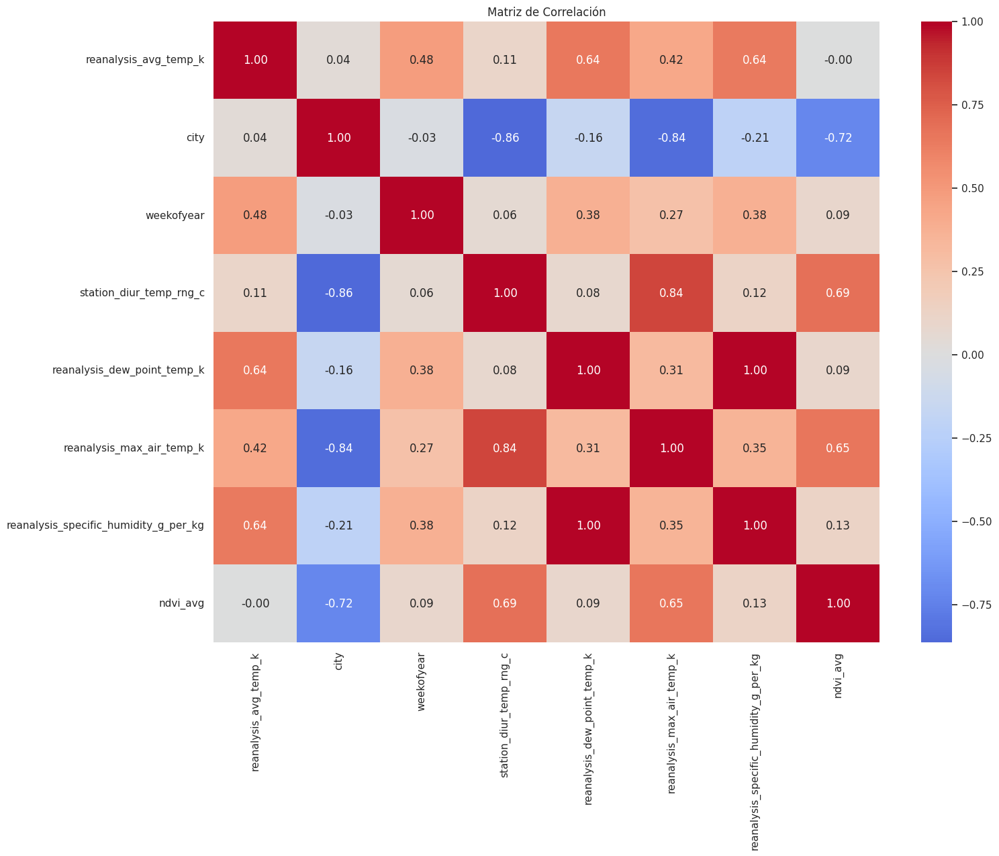

In [68]:
matriz_correlacion = df_scaled.corr()

plt.figure(figsize=(16, 12))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', center=0, fmt=".2f")
plt.title('Matriz de Correlación')
plt.show()

In [69]:
umbral = 0.8

matriz_correlacion = df_scaled.corr()
# Crear un conjunto para almacenar variables que queremos eliminar
variables_eliminar = set()

for i in range(len(matriz_correlacion.columns)):
    for j in range(i):
        if matriz_correlacion.iloc[i, j] > umbral:
            colname = matriz_correlacion.columns[i]
            variables_eliminar.add(colname)

print('Las variables a eliminar son: \n**'+'\n** '.join(variables_eliminar))

Las variables a eliminar son: 
**reanalysis_max_air_temp_k
** reanalysis_specific_humidity_g_per_kg


In [70]:
variables_analysis = list(set(matriz_correlacion.columns)-variables_eliminar)
print("Las variables para el analisis del cluster son:\n* "+'\n* '.join(variables_analysis))
df_preprocessed = df_scaled[variables_analysis]

Las variables para el analisis del cluster son:
* ndvi_avg
* weekofyear
* reanalysis_avg_temp_k
* station_diur_temp_rng_c
* reanalysis_dew_point_temp_k
* city


### Conclusión
Analisando los valores obtenidos en la matriz de correlación y el analisis realizado de las variables se pude observar que la variables
que mejor describen los datos y no tienen problema de colinealidad son las siguientes
+ `city`
+ `reanalysis_avg_temp_k`
+ `station_diur_temp_rng_c`
+ `weekofyear`
+ `ndvi_avg`
+ `reanalysis_dew_point_temp_k`\
Estas variables van a ser usadas en los analisis posteriores.

---
# Clustering
---

En analisis anteriores se selecciono la caracteristicas que no estan muy correlacionadas entre si y son relevantes para el analisis del clustering para agrupar datos similares y descubrir patrones y relaciones de los datos.

### Visualización de los datos
Para visualizar como estan los datos de nuestro dataset se va a realizar un proceso de redución de dimensionalidad para ello se va a aplicar TSNE que es un método no lineal que se utiliza principalmente para visualizar datos de alta dimensionalidad en dos o tres dimensiones, mientras preserva las relaciones locales entre los puntos de datos.

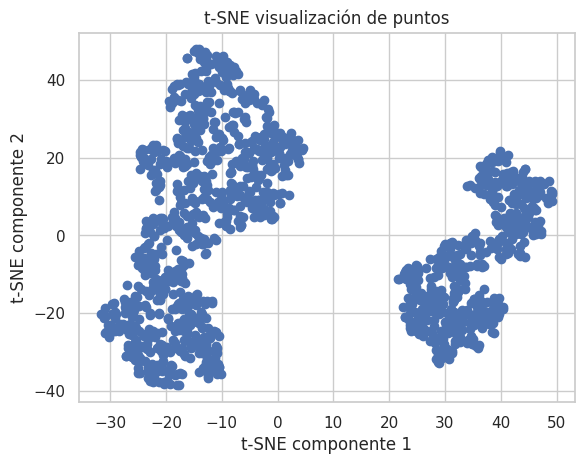

In [71]:
# Crear el modelo t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
# Reducir dimensionalidad
X_tsne = tsne.fit_transform(df_preprocessed)

# Visualizar en 2D (solo puntos)
plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.title('t-SNE visualización de puntos')
plt.xlabel('t-SNE componente 1')
plt.ylabel('t-SNE componente 2')
plt.show()

### Analisis de clusters
Se analizan las técnicas de los clusteres aglomerativos, basado en particiones, jerarquico y probabilisticos

In [72]:
def cluster_ac(x, n_clusters):
    #Agrupa los objetos similares para formar un cluster que esta usando la distancia euclidiana para formar el cluster
    #Con linkage='ward' se utiliza la minimizacion de la variaza de dos clusters ward es para 2
    ac = cluster.AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    #Se realiza el entrenamientio
    ac.fit(x)
    return ac.labels_

def cluster_kmeans(x, n_clusters):
    #Agrupa objetos basandose en la cantidad de clusters
    return cluster.k_means(x, n_clusters=n_clusters,random_state=seed)[1]


def fancy_dendrogram(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
        plt.ylabel('distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

def apply_gmm(X, max_clusters=10):
    """
    Aplica Gaussian Mixture Model (GMM) a los datos y usa el criterio de información bayesiano (BIC)
    para determinar el número óptimo de clústeres.

    Parámetros:
    - X: array-like, matriz de datos de entrada.
    - max_clusters: int, número máximo de clústeres a evaluar (para BIC).

    Retorno:
    - labels: etiquetas de los clústeres para los datos.
    - optimal_clusters: número óptimo de clústeres basado en BIC.
    - gmm: objeto ajustado de GaussianMixture.
    """
    # Evaluar BIC para determinar el número óptimo de clústeres
    bic_scores = []
    models = []
    k_values = range(1, max_clusters+1)

    for k in k_values:
        gmm = GaussianMixture(n_components=k, random_state=seed)
        gmm.fit(X)
        bic_scores.append(gmm.bic(X))
        models.append(gmm)

    # Graficar el BIC para diferentes valores de k
    plt.plot(k_values, bic_scores, marker='o')
    plt.xlabel('Número de Clústeres (k)')
    plt.ylabel('BIC Score')
    plt.title('Método de BIC para encontrar el número óptimo de Clústeres')
    plt.show()

    # Seleccionar el modelo con el menor BIC
    optimal_clusters = k_values[np.argmin(bic_scores)]
    optimal_gmm = models[np.argmin(bic_scores)]

    # Predecir las etiquetas de los clústeres usando el mejor modelo
    labels = optimal_gmm.predict(X)
    print(f'El valor optimo de clusters es: {optimal_clusters}'.format(optimal_clusters=optimal_clusters))

    return labels, optimal_gmm


def plot_cluster(data_tsne,labels):
    """
    Graficar los clusters de los datos

    Parámetros:
    - data_tsne: array-like, matriz de datos de entrada.
    - labels: etiquetas de los clusters

    """
    # plot the cluster assignments
    plt.scatter(data_tsne[:, 0], data_tsne[:, 1], c=labels, cmap='jet')
    plt.xlabel("Feature 0")
    plt.ylabel("Feature 1")


#### Analisis de la hyperparametros para los clusters
Se analizan la cantidadd de cluster a ser los optimos en base a las técnicas de los clusteres aglomerativos, basado en particiones, jerarquico y probabilisticos con el objetivo de ver cual es el mejor valor de clusters a utilizar dentro de nuestro analisis de los datos.

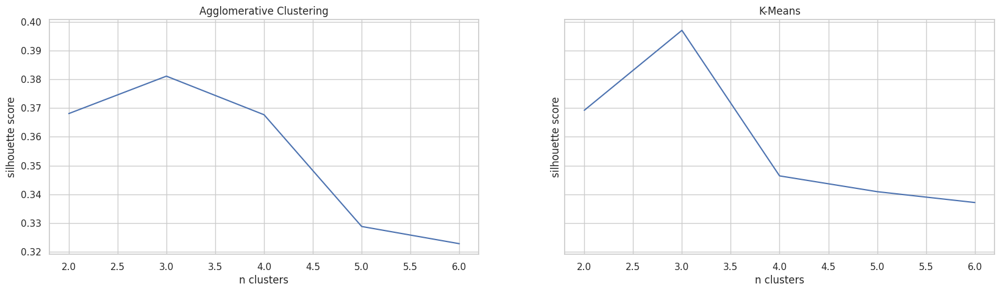

In [73]:
clusters = df_preprocessed.to_numpy()[:, -1]
calcular_silhouette(df_preprocessed, 7)

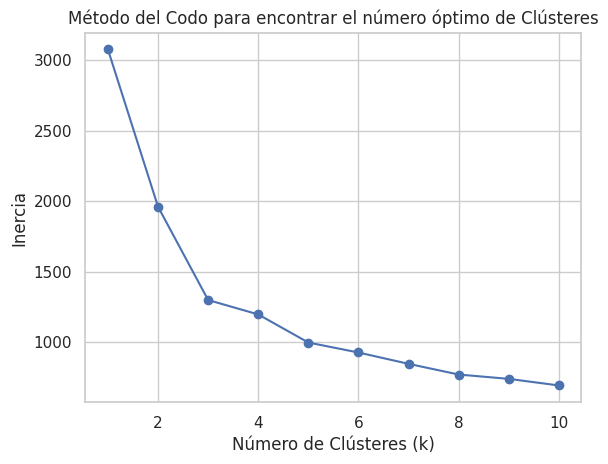

In [74]:
elbow_method(df_preprocessed)

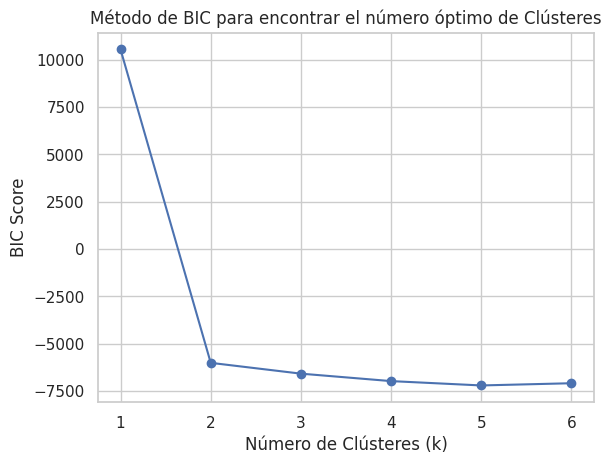

El valor optimo de clusters es: 5


In [75]:
# Aplicar la función para encontrar el número óptimo de clústeres y obtener los clústeres
labels_gmm, gmm = apply_gmm(df_preprocessed, max_clusters=6)

##### Cluster Jerárquico

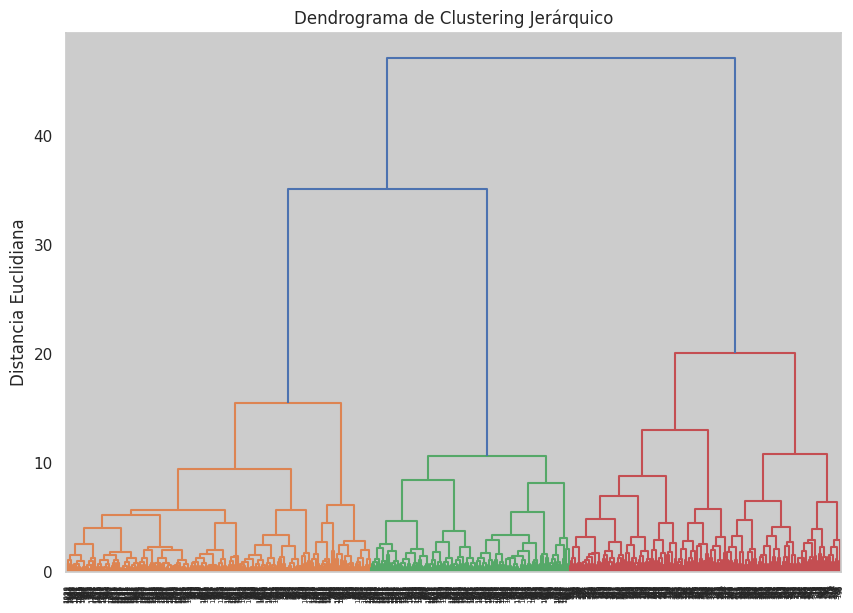

In [76]:
#Cluster Jerárquico
Z = linkage(df_preprocessed, method='ward')
plt.figure(figsize=(10, 7))
dendrogram(Z, labels=df_preprocessed.index, orientation='top', distance_sort='descending')
plt.title('Dendrograma de Clustering Jerárquico')
plt.ylabel("Distancia Euclidiana")
plt.show()

In [77]:
best_t = None
best_score = -1

# Probar diferentes valores de t y ver cuál maximiza el índice de silueta
for t in np.arange(2, 15, 0.25):  # Ajusta el rango según tus datos
    clusters = fcluster(Z, t=t, criterion='distance')
    if len(set(clusters)) > 1:
        score = silhouette_score(df_preprocessed, clusters)
        if score > best_score:
            best_score = score
            best_t = t

# Mostrar el mejor valor de t y el índice de silueta correspondiente
print("El mejor valor de t:", best_t)
print("Mejor índice de silueta:", best_score)

El mejor valor de t: 13.0
Mejor índice de silueta: 0.3287890682106592


##### OPTICS

In [78]:

# Definir los rangos de hiperparámetros a probar
min_samples_range = [5, 10, 15]
xi_range = [0.05, 0.1, 0.2]
min_cluster_size_range = [0.05, 0.1, 0.2]

# Para almacenar los resultados
best_score = -1
best_params = {}

# Bucle de prueba de combinaciones de hiperparámetros
for min_samples, xi, min_cluster_size in itertools.product(min_samples_range, xi_range, min_cluster_size_range):
    # Configuración y ajuste del modelo OPTICS
    optics = OPTICS(min_samples=min_samples, xi=xi, min_cluster_size=min_cluster_size)
    labels = optics.fit_predict(df_preprocessed)

    # Evaluar el clustering usando el índice de Silhouette, solo si hay más de un cluster
    if len(set(labels)) > 1:  # Evitar casos donde todos los puntos sean considerados ruido o un solo cluster
        score = silhouette_score(df_preprocessed, labels)

        # Almacenar si se obtiene un mejor puntaje
        if score > best_score:
            best_score = score
            best_params = {
                'min_samples': min_samples,
                'xi': xi,
                'min_cluster_size': min_cluster_size
            }

print("Mejores hiperparámetros:")
print(best_params)
print(f"Puntaje de Silhouette: {best_score}")

Mejores hiperparámetros:
{'min_samples': 15, 'xi': 0.1, 'min_cluster_size': 0.05}
Puntaje de Silhouette: 0.3679283283213395


In [79]:
n_clusters = 3

De los tipos de clusters analizado anteriormente se realiza se verifica que el valor de los clusters a usar es 3 que es el valor más frecuente  en la evaluación de cada uno de los métodos anteriores.

##### K-means
El algoritmo K-means es uno de los métodos de clustering más populares para dividir un conjunto de datos en
𝐾 grupos (clusters) de forma que los puntos en un mismo grupo sean lo más similares posible entre sí y diferentes a los de otros grupos.

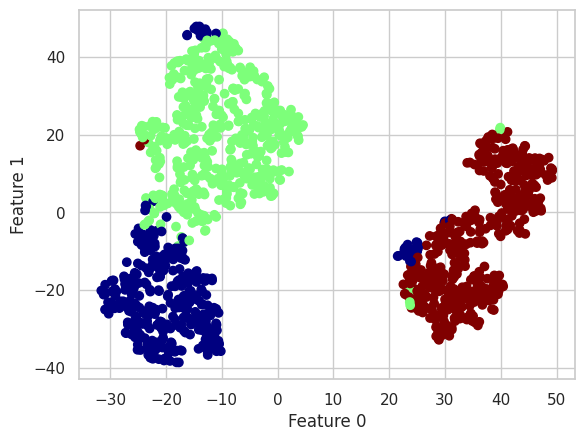

In [80]:
tsne_k_means = cluster_kmeans(df_preprocessed,n_clusters)
plot_cluster(X_tsne,tsne_k_means)

##### Cluster aglomerativo
El cluster aglomerativo es un tipo de clustering jerárquico que construye una jerarquía de clusters mediante un enfoque de abajo hacia arriba (aglomerativo).

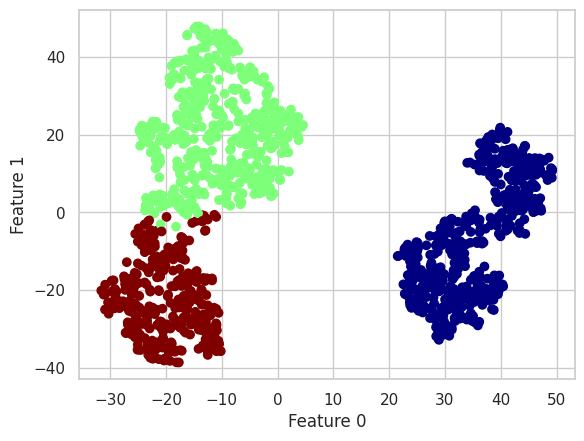

In [81]:
tsne_aglomeartive_clustering = cluster_ac(df_preprocessed,n_clusters)
plot_cluster(X_tsne,tsne_aglomeartive_clustering)

##### Gaussian Mixture Model
El Gaussian Mixture Model (GMM) es un modelo de clustering probabilístico que asume que los datos provienen de una mezcla de varias distribuciones gaussianas (normal) con parámetros desconocidos.

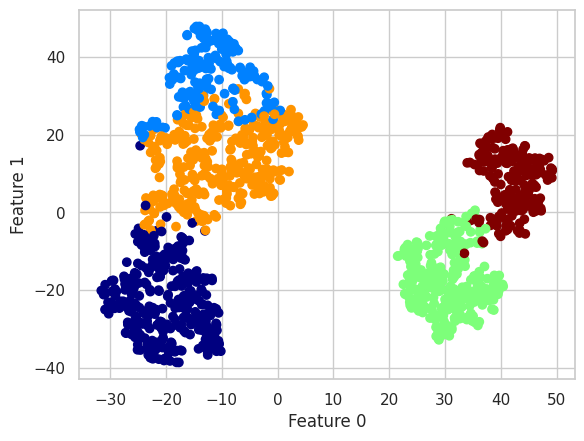

In [82]:
plot_cluster(X_tsne,labels_gmm)

##### Cluster Jerárquico
El clustering jerárquico es un enfoque de agrupamiento no supervisado que busca construir una jerarquía de clusters.

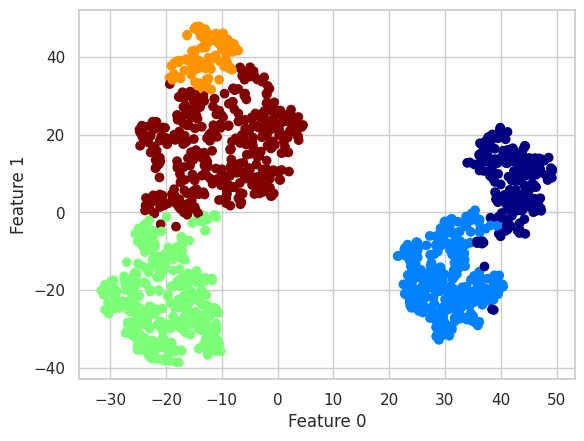

In [83]:
clusters = fcluster(Z, t=best_t, criterion='distance')
plot_cluster(X_tsne,clusters)

##### Cluster OPTICS
OPTICS (Ordering Points To Identify the Clustering Structure) es un algoritmo de clustering basado en densidad, similar a DBSCAN (Density-Based Spatial Clustering of Applications with Noise), pero con algunas ventajas adicionales. OPTICS está diseñado para identificar clusters de cualquier forma (no es necesario que sean esféricos), y no requiere que el número de clusters sea especificado a priori, lo que lo hace útil para trabajar con datos complejos.

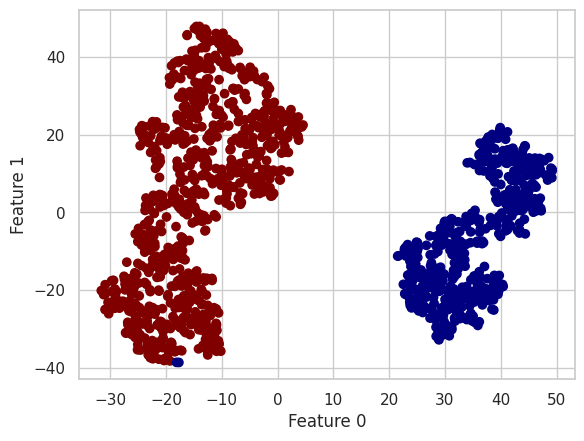

In [84]:
optics = OPTICS(min_samples=best_params['min_samples'], xi=best_params['xi'], min_cluster_size=best_params['min_cluster_size']).fit(df_preprocessed)
labels = optics.labels_
plot_cluster(X_tsne,labels)

##### Resultados
En todos la mayoria de casos empleados para seleccionar el mejor valor de los clusters basado en las metricas de sohouette score y elbow code se obtiene el valor de 3 centroides. Los algoritmos Aglomerativo, K-means, Gaussian Mixture Model, OPTICS y Jerárquico se los ha considerado como candidatos en esta selección del mejor modelo de clustering.
Del analisis anterior tambien se puede visualizar que el método de clustering que mejor agrupo los datos es el cluster Aglomerativo pues es especialmente útil cuando los datos no tienen una forma cilindrica que con la ayuda de la TSNE se pude visualizar dicho caso, visualizando que los métodos agruparon clusters que van desde 2 hasta 5 clusters pero el que mejor logra dividir los datos dados la visualización con T-SNE es el Cluster Aglomerativo debido a que muestra una mejor división de los datos en y la distancia entre cada cluster es alta.

### Clustering de los datos
Se utiliza el método de Cluster aglomerativo para realizar la clusterización de los datos y obtener algun patron de la agrupación de los datos

In [85]:
df_clustering = df_dengue[variables_analysis].copy()
df_clustering['cluster'] = tsne_aglomeartive_clustering
df_clustering.head(20)

,ndvi_avg,weekofyear,reanalysis_avg_temp_k,station_diur_temp_rng_c,reanalysis_dew_point_temp_k,city,cluster
0,0.228307,26.0,25.300000,10.775000,22.034286,0.0,0
1,0.256012,27.0,25.278571,11.566667,22.208571,0.0,0
2,0.170504,28.0,24.242857,11.466667,22.472857,0.0,0
3,0.316546,30.0,24.485714,11.480000,20.807143,0.0,0
4,0.352582,32.0,25.828571,11.650000,20.671429,0.0,0
5,0.375226,33.0,26.185714,10.316667,20.842857,0.0,0
6,0.359936,34.0,26.421429,13.400000,19.754286,0.0,0
7,0.322993,35.0,27.778571,12.266667,20.322857,0.0,0
8,0.327614,37.0,28.221429,12.775000,20.490000,0.0,0
9,0.322986,38.0,25.364286,12.566667,19.557143,0.0,0


In [86]:
df_cluster_0 = df_clustering[df_clustering['cluster']==0]
df_cluster_1 = df_clustering[df_clustering['cluster']==1]
df_cluster_2 = df_clustering[df_clustering['cluster']==2]

#### Analisis del cluster 0

In [87]:
df_cluster_0.head()

,ndvi_avg,weekofyear,reanalysis_avg_temp_k,station_diur_temp_rng_c,reanalysis_dew_point_temp_k,city,cluster
0,0.228307,26.0,25.300000,10.775000,22.034286,0.0,0
1,0.256012,27.0,25.278571,11.566667,22.208571,0.0,0
2,0.170504,28.0,24.242857,11.466667,22.472857,0.0,0
3,0.316546,30.0,24.485714,11.480000,20.807143,0.0,0
4,0.352582,32.0,25.828571,11.650000,20.671429,0.0,0


In [88]:
df_cluster_0.describe()

,ndvi_avg,weekofyear,reanalysis_avg_temp_k,station_diur_temp_rng_c,reanalysis_dew_point_temp_k,city,cluster
count,456.000000,456.000000,456.000000,456.000000,456.000000,456.0,456.0
mean,0.257179,26.745614,26.039626,10.602119,22.395116,0.0,0.0
std,0.072728,15.127334,1.296183,1.428608,1.275430,0.0,0.0
min,0.084155,1.000000,22.271429,6.300000,17.820000,0.0,0.0
25%,0.202390,14.000000,25.144643,9.550000,21.517857,0.0,0.0
50%,0.256696,27.000000,26.021429,10.609590,22.680714,0.0,0.0
75%,0.306949,40.000000,26.982143,11.627083,23.383214,0.0,0.0
max,0.503982,53.000000,29.778571,14.900000,25.011429,0.0,0.0


#### Analisis del cluster 1

In [89]:
df_cluster_1.head()

,ndvi_avg,weekofyear,reanalysis_avg_temp_k,station_diur_temp_rng_c,reanalysis_dew_point_temp_k,city,cluster
458,0.133315,20.0,25.728571,6.485714,22.284286,1.0,1
459,0.209286,21.0,26.078571,6.771429,22.160000,1.0,1
460,0.239235,22.0,26.514286,9.371429,22.671429,1.0,1
461,0.195393,23.0,26.614286,6.942857,22.701429,1.0,1
462,0.155261,24.0,26.071429,6.771429,22.715714,1.0,1


In [90]:
df_cluster_1.describe()

,ndvi_avg,weekofyear,reanalysis_avg_temp_k,station_diur_temp_rng_c,reanalysis_dew_point_temp_k,city,cluster
count,513.000000,513.000000,513.000000,513.000000,513.000000,513.0,513.0
mean,0.120906,35.984405,26.891873,6.727208,22.862043,1.0,1.0
std,0.052218,9.473016,0.839290,0.693866,0.984375,0.0,0.0
min,-0.082018,18.000000,23.357143,4.585714,18.274286,1.0,1.0
25%,0.087648,28.000000,26.428571,6.271429,22.430000,1.0,1.0
50%,0.118517,36.000000,26.978571,6.742857,23.065714,1.0,1.0
75%,0.147049,44.000000,27.492857,7.185714,23.508571,1.0,1.0
max,0.326207,53.000000,29.014286,9.371429,24.645714,1.0,1.0


#### Analisis del cluster 2

In [91]:
df_cluster_2.head()

,ndvi_avg,weekofyear,reanalysis_avg_temp_k,station_diur_temp_rng_c,reanalysis_dew_point_temp_k,city,cluster
456,0.150606,18.0,24.592857,6.900000,19.264286,1.0,2
457,0.157479,19.0,25.292857,6.371429,20.801429,1.0,2
487,0.151445,1.0,23.985714,7.457143,18.757143,1.0,2
488,0.158074,2.0,24.678571,6.314286,20.132857,1.0,2
489,0.254506,3.0,24.507143,6.571429,20.262857,1.0,2


In [92]:
df_cluster_2.describe()

,ndvi_avg,weekofyear,reanalysis_avg_temp_k,station_diur_temp_rng_c,reanalysis_dew_point_temp_k,city,cluster
count,335.000000,335.000000,335.000000,335.000000,335.000000,335.0,335.0
mean,0.115981,10.405970,24.968903,6.882915,20.392034,1.0,2.0
std,0.064250,6.068666,0.759076,0.934971,1.058098,0.0,0.0
min,-0.092565,1.000000,22.964286,4.528571,16.677143,1.0,2.0
25%,0.072828,5.000000,24.478571,6.214286,19.778571,1.0,2.0
50%,0.108727,10.000000,24.942857,6.900000,20.408571,1.0,2.0
75%,0.151406,15.000000,25.446429,7.528571,21.102857,1.0,2.0
max,0.342338,32.000000,26.714286,9.214286,22.725714,1.0,2.0


#### Interpretación de los resultados del clustering
Se analisan los datos de los clustering sin normalizar para tener las medidas estadisticas reales de cada cluster \
En el `cluster 0` se tienen los siguientes datos que caracterizan al cluster
- Registros: Se obtienen 456 registros en el cluster
- Campos con valores predominantes
    * city: el valor que predomina es de la ciudad con la codificación normalizada 0 que corresponde al valor de `San Juan`
    * weekofyear: la columna muestra todos los valores de la semana al ser solo de la ciudad que predomina
    * reanalysis_dew_point_temp_k: Muestra valores minimos de 17.82 y máximo de 25.01
    * reanalysis_avg_temp_k: Muestra valores minimos de 22.27 y máximo de 29.77
    * station_diur_temp_rng_c: Muestra valores minimos de 6.30 y máximo de 14.90
    * ndvi_avg: Muestra valores minimos de 0.084 y máximo de 0.5039
- Caracterisitcas predominantes:
    * El NDVI es relativamente alto en comparación con los otros clusters, lo que puede indicar una vegetación más densa.
    * Las temperaturas (punto de rocío y promedio) son moderadas, sin extremos significativos, lo que podría estar asociado con un clima templado.
    * San Juan es la ciudad predominante en este cluster, lo que implica que todos los registros pertenecen a esta ciudad.
      
En el `cluster 1` se tienen los siguientes datos que caracterizan al cluster
- Registros: Se obtienen 513 registros en el cluster
- Campos con valores predominantes
    * city: el valor que predomina es de la ciudad con la codificación normalizada 1 que corresponde al valor de `Iquitos`
    * weekofyear: la columna muestra el valor mínimo de 18 y máximo de 53
    * reanalysis_dew_point_temp_k: Muestra valores minimos de 18.27 y máximo de 24.64
    * reanalysis_avg_temp_k: Muestra valores minimos de 23.53 y máximo de 29.01
    * station_diur_temp_rng_c: Muestra valores minimos de 4.58 y máximo de 9.37
    * ndvi_avg: Muestra valores minimos de -0.082 y máximo de 0.326
- Caracterisitcas predominantes:
    *  El NDVI es bajo en comparación con el cluster 0, lo que podría indicar menos vegetación o vegetación de menor densidad.
    * Las temperaturas son ligeramente más altas que en el cluster 0, pero aún dentro de un rango moderado.
    * Los registros pertenecen predominantemente a Iquitos, lo que significa que los datos reflejan el clima y las características de esta ciudad.

En el `cluster 2` se tienen los siguientes datos que caracterizan al cluster
- Registros: Se obtienen 335 registros en el cluster
- Campos con valores predominantes
    * city: el valor que predomina es de la ciudad con la codificación normalizada 1 que corresponde al valor de `Iquitos`
    * weekofyear: la columna muestra el valor mínimo de 1 y máximo de 32
    * reanalysis_dew_point_temp_k: Muestra valores minimos de 16.67 y máximo de 22.72
    * reanalysis_avg_temp_k: Muestra valores minimos de 22.96 y máximo de 26.71
    * station_diur_temp_rng_c: Muestra valores minimos de 4.528 y máximo de 9.21
    * ndvi_avg: Muestra valores minimos de -0.092 y máximo de 0.342
- Caracterisitcas predominantes:
    * El NDVI también es bajo, similar al cluster 1, lo que sugiere que la vegetación en esta zona también podría ser menos densa.
    * Las temperaturas en este cluster son algo más frescas en comparación con el cluster 1, pero todavía dentro de un rango moderado.
    * Al igual que en el cluster 1, Iquitos es la ciudad predominante en este grupo.

En resumen, San Juan se caracteriza por mayor vegetación y temperaturas más moderadas, mientras que Iquitos en los clusters 1 y 2 tiene temperaturas más altas o más frescas, pero con un NDVI relativamente bajo, lo que sugiere menos vegetación en comparación con San Juan.

---
# Conclusiones
---

En el análisis del dataset, se analizaron los datos desde un punto de vista técnico, teniendo en cuenta el significado de cada variable dentro del conjunto de datos. Se convirtió la temperatura de grados Kelvin a grados centígrados (°C) para llevar a una escala de medición única, con el objetivo de interpretar los resultados de mejor manera en el análisis univariable, bivariable y multivaraible.

En el preprocesamiento de los datos, se tomó la decisión de eliminar los outliers en lugar de completarlos con valores como la media, la mediana o la moda, dependiendo de la variable. Esta decisión se basa en que los datos que se alejan significativamente del análisis intercuartílico no deben ser llenados, ya que esto no es ideal para evitar sobreajustes. Además, la cantidad de registros no era muy representativa con respecto a la cantidad total de datos.

El clustering se caracteriza por agrupar datos similares en grupos, pero en este dataset hay muchas características. Por lo tanto, era necesario seleccionar solo aquellas características que aportaran información relevante comparado a las otras caracteristicas. Esto hizo necesario realizar un paso previo de selección de características y, a su vez, normalizarlas para transformar los datos y ajustarlos a una escala común sin distorsionar las diferencias en los rangos de valores. Después del procedimiento mencionado, se tomaron en cuenta los clusters Aglomerativo, K-means, Gaussian Mixture Model, OPTICS y Jerárquico, que fueron considerados como candidatos. Después de aplicar las diferentes técnicas de clustering se visualizó los mimos en dos dimensiones para ello se uso el algoritmo de reducción de dimensionalidad T-SNE, observando de manera visual que el mejor algoritmo es el Aglomerativo debido a que muestra una mejor división de los datos en y la distancia entre cada cluster es alta.

Los resultados obtenidos al realizar el clustering revelan la existencia de tres grupos bien diferenciados, con variables clave como `city`, `ndvi_avg` y `reanalysis_avg_temp_k`, que permiten distinguir estos clusters. En el `Cluster 0` predomina San Juan con temperaturas moderadas, un rango más alto de NDVI, y variabilidad en la temperatura diurna. En el `Cluster 1` predomina Iquitos con temperaturas ligeramente más altas que en el cluster 0, un NDVI bajo, y una mayor variabilidad en las semanas del año y finalmente en el `Cluster 2` también Iquitos, pero con temperaturas más frescas en comparación con el cluster 1, un NDVI bajo y menor variabilidad en las semanas del año. En resumen, San Juan se caracteriza por mayor vegetación y temperaturas más moderadas, mientras que Iquitos en los clusters 1 y 2 tiene temperaturas más altas o más frescas, pero con un NDVI relativamente bajo, lo que sugiere menos vegetación en comparación con San Juan.

Finalmente, en trabajos futuros sobre el análisis y predicción del dengue, se propone mejorar la información recopilada mediante las redes sociales o sensores IoT. También se busca optimizar la predicción a nivel geográfico más granular y evaluar el impacto de políticas públicas en la prevención.

# Referencias
El código ha sido elaborado de parte propia con la ayuda de inteligencias artificiales generativas